
## Banking Customer Sample Dataset

### Banking | Marketing | Leads Conversion Data: https://www.kaggle.com/arashnic/banking-loan-prediction

In [1]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt # plotting
import numpy as np # linear algebra
import os # accessing directory structure
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import plotly.graph_objects as go
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

### Test Dataset

In [2]:
nRowsRead = None # specify 'None' if want to read whole file
# test.csv may have more rows in reality, but we are only loading/previewing the first 1000 rows
df_test = pd.read_csv(r'C:\Users\Acer\OneDrive - DigiPen Institute of Technology\Desktop\work\Weekly Summary\Banking and Leads Conversion/test_loan/test.csv', delimiter=',', nrows = nRowsRead)
df_test.dataframeName = 'test.csv'
nRow, nCol = df_test.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 30037 rows and 21 columns


In [3]:
df_test.head()

,ID,Gender,DOB,Lead_Creation_Date,City_Code,City_Category,Employer_Code,Employer_Category1,Employer_Category2,Monthly_Income,...,Primary_Bank_Type,Contacted,Source,Source_Category,Existing_EMI,Loan_Amount,Loan_Period,Interest_Rate,EMI,Var1
0,APPA70109647212,Male,03/06/88,05/07/16,C10028,C,COM0002222,A,4.0,2150.0,...,P,Y,S122,B,0.0,10000.0,3.0,20.0,372.0,4
1,APPB10687939341,Male,13/07/81,01/07/16,C10003,A,COM0001784,C,4.0,4200.0,...,P,Y,S133,C,0.0,69000.0,5.0,24.0,1985.0,7
2,APPC80449411414,Female,19/11/90,01/07/16,C10009,B,COM0045260,B,4.0,1000.0,...,P,N,S133,B,0.0,NaN,NaN,NaN,NaN,0
3,APPD30665094501,Female,15/10/92,01/07/16,C10005,A,COM0000085,A,3.0,1465.0,...,P,N,S133,C,0.0,NaN,NaN,NaN,NaN,0
4,APPE80379821637,Male,21/09/88,01/07/16,C10005,A,COM0006422,A,4.0,2340.0,...,P,Y,S143,B,500.0,10000.0,2.0,NaN,NaN,0


In [4]:
df_eco = pd.read_csv('combined_data.csv')
df_eco.head()

,Unnamed: 0,quarter,cpi_val,gdp_val,ppi_val,hdbpi_val,rental_val
0,0,2004-Q1,76.887667,47011.4,80.3,75.3,64.0
1,1,2004-Q2,77.058333,47431.6,80.4,76.2,64.0
2,2,2004-Q3,77.184000,49234.5,80.7,76.3,64.2
3,3,2004-Q4,77.411667,50562.7,81.3,77.1,64.6
4,4,2005-Q1,77.681000,51062.3,81.9,77.2,65.2


In [5]:
quarters = df_eco.quarter.tolist()
quarters[:5]

['2004-Q1', '2004-Q2', '2004-Q3', '2004-Q4', '2005-Q1']

In [6]:
test=df_test.copy()
test["quarter"] = np.random.choice(quarters, size=test.shape[0])
test.head()

,ID,Gender,DOB,Lead_Creation_Date,City_Code,City_Category,Employer_Code,Employer_Category1,Employer_Category2,Monthly_Income,...,Contacted,Source,Source_Category,Existing_EMI,Loan_Amount,Loan_Period,Interest_Rate,EMI,Var1,quarter
0,APPA70109647212,Male,03/06/88,05/07/16,C10028,C,COM0002222,A,4.0,2150.0,...,Y,S122,B,0.0,10000.0,3.0,20.0,372.0,4,2018-Q3
1,APPB10687939341,Male,13/07/81,01/07/16,C10003,A,COM0001784,C,4.0,4200.0,...,Y,S133,C,0.0,69000.0,5.0,24.0,1985.0,7,2014-Q1
2,APPC80449411414,Female,19/11/90,01/07/16,C10009,B,COM0045260,B,4.0,1000.0,...,N,S133,B,0.0,NaN,NaN,NaN,NaN,0,2011-Q2
3,APPD30665094501,Female,15/10/92,01/07/16,C10005,A,COM0000085,A,3.0,1465.0,...,N,S133,C,0.0,NaN,NaN,NaN,NaN,0,2015-Q4
4,APPE80379821637,Male,21/09/88,01/07/16,C10005,A,COM0006422,A,4.0,2340.0,...,Y,S143,B,500.0,10000.0,2.0,NaN,NaN,0,2010-Q4


In [7]:
comb = test.merge(df_eco.drop('Unnamed: 0', axis=1), on='quarter',how='outer')
comb.head()

,ID,Gender,DOB,Lead_Creation_Date,City_Code,City_Category,Employer_Code,Employer_Category1,Employer_Category2,Monthly_Income,...,Loan_Period,Interest_Rate,EMI,Var1,quarter,cpi_val,gdp_val,ppi_val,hdbpi_val,rental_val
0,APPA70109647212,Male,03/06/88,05/07/16,C10028,C,COM0002222,A,4.0,2150.0,...,3.0,20.0,372.0,4,2018-Q3,99.322667,123813.5,149.7,131.6,104.1
1,APPP70300016724,Male,23/01/88,01/07/16,C10003,A,COM0035692,B,4.0,3000.0,...,3.0,NaN,NaN,7,2018-Q3,99.322667,123813.5,149.7,131.6,104.1
2,APPI50441679612,Female,10/08/87,03/07/16,C10004,A,COM0036472,B,4.0,1550.0,...,NaN,NaN,NaN,0,2018-Q3,99.322667,123813.5,149.7,131.6,104.1
3,APPH10099261128,Female,24/06/87,05/07/16,C10004,A,COM0000513,B,4.0,4500.0,...,5.0,NaN,NaN,10,2018-Q3,99.322667,123813.5,149.7,131.6,104.1
4,APPP90991305913,Male,21/05/85,06/07/16,C10008,A,COM0001347,C,4.0,2500.0,...,5.0,15.5,938.0,10,2018-Q3,99.322667,123813.5,149.7,131.6,104.1


In [8]:
comb.isna().sum()

ID                                         0
Gender                                     0
DOB                                        3
Lead_Creation_Date                         0
City_Code                                314
City_Category                            314
Employer_Code                           1605
Employer_Category1                      1605
Employer_Category2                      1695
Monthly_Income                             0
Customer_Existing_Primary_Bank_Code     4037
Primary_Bank_Type                       4037
Contacted                                  0
Source                                     0
Source_Category                            0
Existing_EMI                              32
Loan_Amount                            11871
Loan_Period                            11871
Interest_Rate                          20385
EMI                                    20385
Var1                                       0
quarter                                    0
cpi_val   

### Train Dataset

In [9]:
nRowsRead = None # specify 'None' if want to read whole file
# train.csv may have more rows in reality, but we are only loading/previewing the first 1000 rows
df_train = pd.read_csv(r'C:\Users\Acer\OneDrive - DigiPen Institute of Technology\Desktop\work\Weekly Summary\Banking and Leads Conversion/train_loan/train.csv', delimiter=',', nrows = nRowsRead)
df_train.dataframeName = 'train.csv'
nRow, nCol = df_train.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 69713 rows and 22 columns


In [10]:
df_train.head()

,ID,Gender,DOB,Lead_Creation_Date,City_Code,City_Category,Employer_Code,Employer_Category1,Employer_Category2,Monthly_Income,...,Contacted,Source,Source_Category,Existing_EMI,Loan_Amount,Loan_Period,Interest_Rate,EMI,Var1,Approved
0,APPC90493171225,Female,23/07/79,15/07/16,C10001,A,COM0044082,A,4.0,2000.0,...,N,S122,G,0.0,NaN,NaN,NaN,NaN,0,0
1,APPD40611263344,Male,07/12/86,04/07/16,C10003,A,COM0000002,C,1.0,3500.0,...,Y,S122,G,0.0,20000.0,2.0,13.25,953.0,10,0
2,APPE70289249423,Male,10/12/82,19/07/16,C10125,C,COM0005267,C,4.0,2250.0,...,Y,S143,B,0.0,45000.0,4.0,NaN,NaN,0,0
3,APPF80273865537,Male,30/01/89,09/07/16,C10477,C,COM0004143,A,4.0,3500.0,...,Y,S143,B,0.0,92000.0,5.0,NaN,NaN,7,0
4,APPG60994436641,Male,19/04/85,20/07/16,C10002,A,COM0001781,A,4.0,10000.0,...,Y,S134,B,2500.0,50000.0,2.0,NaN,NaN,10,0


In [11]:
train=df_train.copy()
train["quarter"] = np.random.choice(quarters, size=train.shape[0])
train.head()

,ID,Gender,DOB,Lead_Creation_Date,City_Code,City_Category,Employer_Code,Employer_Category1,Employer_Category2,Monthly_Income,...,Source,Source_Category,Existing_EMI,Loan_Amount,Loan_Period,Interest_Rate,EMI,Var1,Approved,quarter
0,APPC90493171225,Female,23/07/79,15/07/16,C10001,A,COM0044082,A,4.0,2000.0,...,S122,G,0.0,NaN,NaN,NaN,NaN,0,0,2009-Q2
1,APPD40611263344,Male,07/12/86,04/07/16,C10003,A,COM0000002,C,1.0,3500.0,...,S122,G,0.0,20000.0,2.0,13.25,953.0,10,0,2004-Q3
2,APPE70289249423,Male,10/12/82,19/07/16,C10125,C,COM0005267,C,4.0,2250.0,...,S143,B,0.0,45000.0,4.0,NaN,NaN,0,0,2012-Q3
3,APPF80273865537,Male,30/01/89,09/07/16,C10477,C,COM0004143,A,4.0,3500.0,...,S143,B,0.0,92000.0,5.0,NaN,NaN,7,0,2015-Q1
4,APPG60994436641,Male,19/04/85,20/07/16,C10002,A,COM0001781,A,4.0,10000.0,...,S134,B,2500.0,50000.0,2.0,NaN,NaN,10,0,2004-Q1


In [12]:
com_train = train.merge(df_eco.drop('Unnamed: 0', axis=1), on='quarter',how='outer')
com_train.head()

,ID,Gender,DOB,Lead_Creation_Date,City_Code,City_Category,Employer_Code,Employer_Category1,Employer_Category2,Monthly_Income,...,Interest_Rate,EMI,Var1,Approved,quarter,cpi_val,gdp_val,ppi_val,hdbpi_val,rental_val
0,APPC90493171225,Female,23/07/79,15/07/16,C10001,A,COM0044082,A,4.0,2000.0,...,NaN,NaN,0,0,2009-Q2,85.323667,69013.9,95.3,101.4,94.8
1,APPS60734495841,Male,11/12/86,08/07/16,C10032,C,COM0019508,C,4.0,2899.4,...,15.5,722.0,0,0,2009-Q2,85.323667,69013.9,95.3,101.4,94.8
2,APPJ80866622106,Male,14/03/83,01/07/16,C10712,C,COM0050844,A,4.0,2500.0,...,20.0,795.0,7,0,2009-Q2,85.323667,69013.9,95.3,101.4,94.8
3,APPM40090599603,Male,07/12/80,01/07/16,C10019,B,COM0011887,A,4.0,3500.0,...,NaN,NaN,4,0,2009-Q2,85.323667,69013.9,95.3,101.4,94.8
4,APPN50870546331,Female,19/09/89,01/07/16,C10260,C,COM0008300,A,4.0,900.0,...,NaN,NaN,0,0,2009-Q2,85.323667,69013.9,95.3,101.4,94.8


In [13]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69713 entries, 0 to 69712
Data columns (total 22 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ID                                   69713 non-null  object 
 1   Gender                               69713 non-null  object 
 2   DOB                                  69698 non-null  object 
 3   Lead_Creation_Date                   69713 non-null  object 
 4   City_Code                            68899 non-null  object 
 5   City_Category                        68899 non-null  object 
 6   Employer_Code                        65695 non-null  object 
 7   Employer_Category1                   65695 non-null  object 
 8   Employer_Category2                   65415 non-null  float64
 9   Monthly_Income                       69713 non-null  float64
 10  Customer_Existing_Primary_Bank_Code  60322 non-null  object 
 11  Primary_Bank_Type           

In [14]:
df_train.isna().sum()

ID                                         0
Gender                                     0
DOB                                       15
Lead_Creation_Date                         0
City_Code                                814
City_Category                            814
Employer_Code                           4018
Employer_Category1                      4018
Employer_Category2                      4298
Monthly_Income                             0
Customer_Existing_Primary_Bank_Code     9391
Primary_Bank_Type                       9391
Contacted                                  0
Source                                     0
Source_Category                            0
Existing_EMI                              51
Loan_Amount                            27709
Loan_Period                            27709
Interest_Rate                          47437
EMI                                    47437
Var1                                       0
Approved                                   0
dtype: int

In [15]:
df_test.isna().sum()

ID                                         0
Gender                                     0
DOB                                        3
Lead_Creation_Date                         0
City_Code                                314
City_Category                            314
Employer_Code                           1605
Employer_Category1                      1605
Employer_Category2                      1695
Monthly_Income                             0
Customer_Existing_Primary_Bank_Code     4037
Primary_Bank_Type                       4037
Contacted                                  0
Source                                     0
Source_Category                            0
Existing_EMI                              32
Loan_Amount                            11871
Loan_Period                            11871
Interest_Rate                          20385
EMI                                    20385
Var1                                       0
dtype: int64

In [16]:
com_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69713 entries, 0 to 69712
Data columns (total 28 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ID                                   69713 non-null  object 
 1   Gender                               69713 non-null  object 
 2   DOB                                  69698 non-null  object 
 3   Lead_Creation_Date                   69713 non-null  object 
 4   City_Code                            68899 non-null  object 
 5   City_Category                        68899 non-null  object 
 6   Employer_Code                        65695 non-null  object 
 7   Employer_Category1                   65695 non-null  object 
 8   Employer_Category2                   65415 non-null  float64
 9   Monthly_Income                       69713 non-null  float64
 10  Customer_Existing_Primary_Bank_Code  60322 non-null  object 
 11  Primary_Bank_Type           

In [17]:
com_train.isna().sum()

ID                                         0
Gender                                     0
DOB                                       15
Lead_Creation_Date                         0
City_Code                                814
City_Category                            814
Employer_Code                           4018
Employer_Category1                      4018
Employer_Category2                      4298
Monthly_Income                             0
Customer_Existing_Primary_Bank_Code     9391
Primary_Bank_Type                       9391
Contacted                                  0
Source                                     0
Source_Category                            0
Existing_EMI                              51
Loan_Amount                            27709
Loan_Period                            27709
Interest_Rate                          47437
EMI                                    47437
Var1                                       0
Approved                                   0
quarter   

### Train Data Distribution

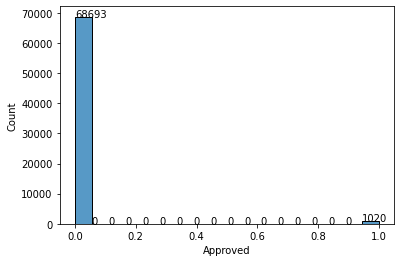

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
ax = sns.histplot(df_train.iloc[:,-1])
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()))

Loan amount median value: 30000.0


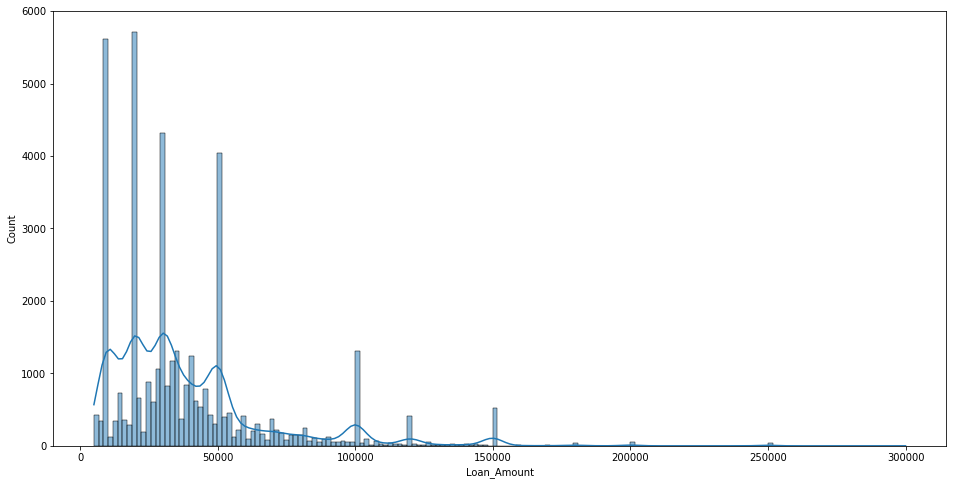

In [19]:

plt.figure(figsize=(16,8))
sns.histplot(df_train.Loan_Amount, kde=True)
print(f'Loan amount median value: {df_train.Loan_Amount.median()}')

Loan period median value: 4.0


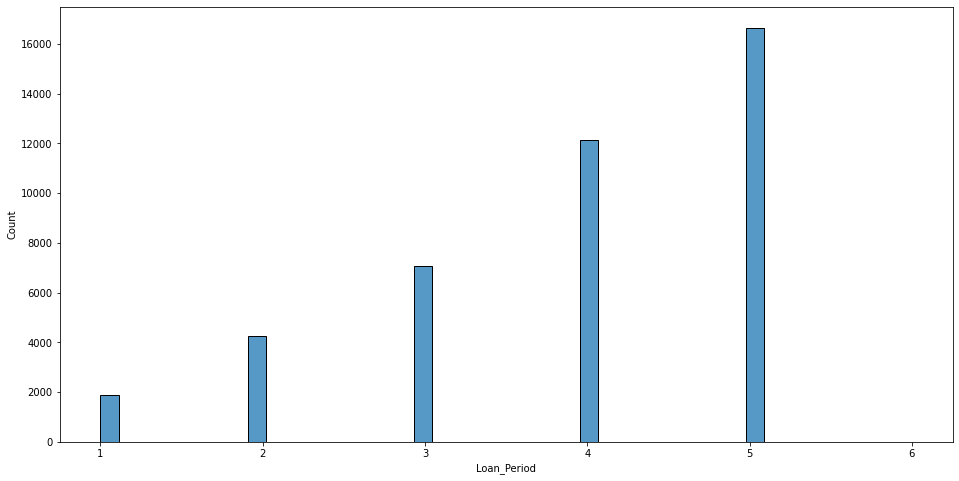

In [20]:
plt.figure(figsize=(16,8))
sns.histplot(df_train.Loan_Period)
print(f'Loan period median value: {df_train.Loan_Period.median()}')

Interest median value: 18.0


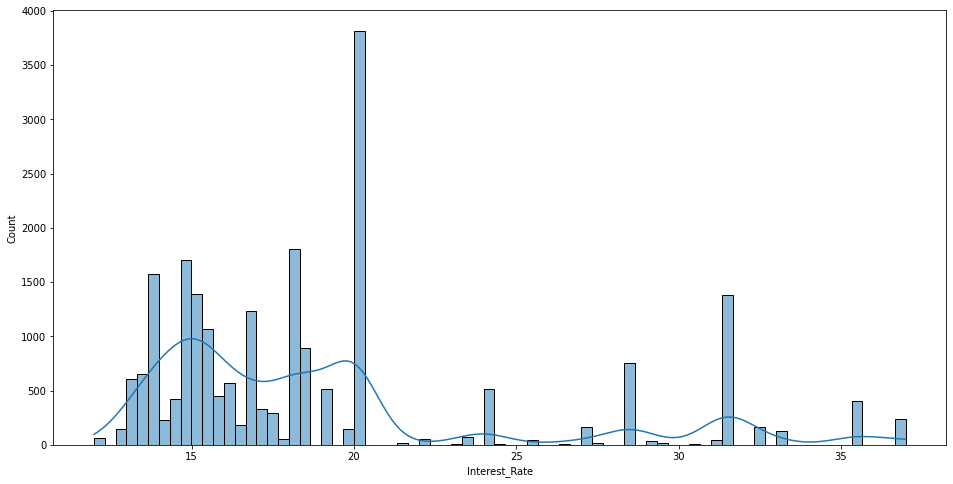

In [21]:
plt.figure(figsize=(16,8))
sns.histplot(df_train.Interest_Rate, kde=True)
print(f'Interest median value: {df_train.Interest_Rate.median()}')

EMI median value: 941.0


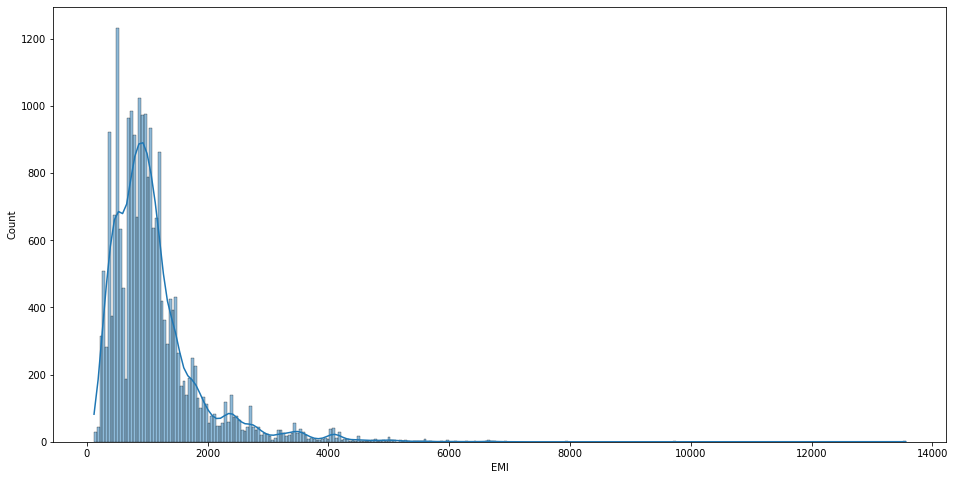

In [22]:
plt.figure(figsize=(16,8))
sns.histplot(df_train.EMI, kde=True)
print(f'EMI median value: {df_train.EMI.median()}')

### Preprocessing:
* Fillin missing datas, can also drop missing datas in order to make mode more precise
* Encode categorical data to label
* Normalization
* Train test split


In [23]:
# df2.median()
# fill nan value 
# newdf2 = df2.fillna(df2.median())
# newdf2.isna().sum()
def impute_miss(df):
    for col in df.columns:         # imputation with either median or mode depending on number of unique entries in each column
        if df[col].dtype==object:
            df[col].fillna(df[col].mode()[0],inplace=True)
        else:
            df[col].fillna(df[col].median(),inplace=True)
    return df
cleaned_train = df_train.copy()
cleaned_train = impute_miss(cleaned_train)
cleaned_train.isna().sum()

ID                                     0
Gender                                 0
DOB                                    0
Lead_Creation_Date                     0
City_Code                              0
City_Category                          0
Employer_Code                          0
Employer_Category1                     0
Employer_Category2                     0
Monthly_Income                         0
Customer_Existing_Primary_Bank_Code    0
Primary_Bank_Type                      0
Contacted                              0
Source                                 0
Source_Category                        0
Existing_EMI                           0
Loan_Amount                            0
Loan_Period                            0
Interest_Rate                          0
EMI                                    0
Var1                                   0
Approved                               0
dtype: int64

In [24]:
eco_train = impute_miss(com_train)
eco_train.isna().sum()

ID                                     0
Gender                                 0
DOB                                    0
Lead_Creation_Date                     0
City_Code                              0
City_Category                          0
Employer_Code                          0
Employer_Category1                     0
Employer_Category2                     0
Monthly_Income                         0
Customer_Existing_Primary_Bank_Code    0
Primary_Bank_Type                      0
Contacted                              0
Source                                 0
Source_Category                        0
Existing_EMI                           0
Loan_Amount                            0
Loan_Period                            0
Interest_Rate                          0
EMI                                    0
Var1                                   0
Approved                               0
quarter                                0
cpi_val                                0
gdp_val         

In [25]:
# # import plotly.offline as pyo
# # pyo.init_notebook_mode(connected=False)
# # sankey data visualization example

# bins=[0,3000,6000,9000,12000]
# group=['Low','Average','High','Very high']
# temp=cleaned_train.copy()
# temp['Income_bin']=pd.cut(temp['Monthly_Income'],bins,labels=group)
# # Income_bin=pd.crosstab(train['Income_bin'],train['Approved'])
# # Income_bin.div(Income_bin.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True)
# # plt.xlabel('Monthly Income Tier')
# # plt.ylabel('Normalized')
# temp['Income_bin'].fillna(temp['Income_bin'].mode()[0], inplace=True)
# # sankey.sankey(left=temp['Income_bin'], right=temp['Approved'], aspect=20,
# #     fontsize=16, figure_name='Income to approved cases')
# # sankey.sankey(left=temp['Var1'], right=temp['Approved'], aspect=20,
# #     fontsize=16, figure_name='Var1 to approved cases')

# income_var1 = pd.concat([temp['Income_bin'],temp['Var1']], axis=0)
# var1_app = pd.concat([temp['Var1'],temp['Approved']], axis=0)

# # # print(cleaned_train['Employer_Category2'][:5])
# source = temp['Income_bin']
# # print(source.dtype)
# target = temp['Var1']
# # columns = ['Monthly_Income']
# # value = cleaned_train['Var1']

# # data to dict, dict to sankey
# # link = dict(source = source, target = target, value = value)
# link = dict(source = source, target = target)
# node = dict(line = dict(color = "green", width = 0.5), pad=25, thickness=5, color = 'blue')
# data = go.Sankey(link = link, node=node,arrangement= 'freeform')

# # plot
# fig = go.Figure(data)
# # fig.update_layout(
# #     hovermode = 'x',
# #     title="Income vs Approval",
# #     font=dict(size = 12, color = 'black'),
# # #     paper_bgcolor='#5B5958',
# # )
# fig.show()

# # from pySankey import sankey

# # sankey.sankey(left=cleaned_train['Monthly_Income'], right=cleaned_train['Approved'], aspect=20,
# #     fontsize=20, figure_name='Monthly income to approved cases')

## Overview of approved cases with different interest_rate, loan amount, loan period and monthly income

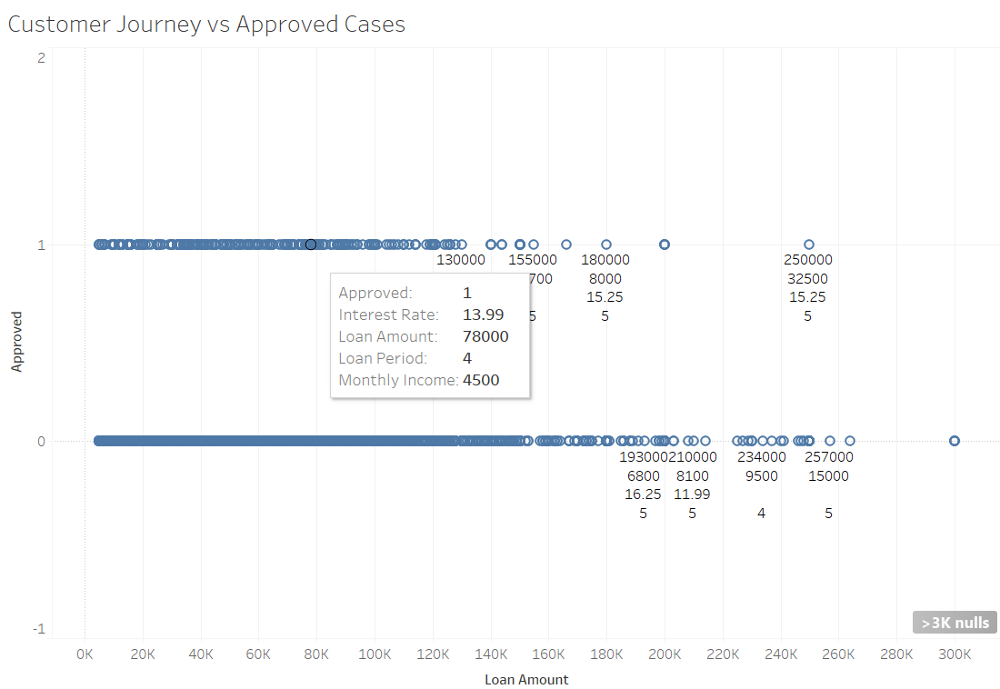

## Customer Journey: Triggering Features

array([[<AxesSubplot:title={'center':'Employer_Category2'}>,
        <AxesSubplot:title={'center':'Monthly_Income'}>,
        <AxesSubplot:title={'center':'Existing_EMI'}>],
       [<AxesSubplot:title={'center':'Loan_Amount'}>,
        <AxesSubplot:title={'center':'Loan_Period'}>,
        <AxesSubplot:title={'center':'Interest_Rate'}>],
       [<AxesSubplot:title={'center':'EMI'}>,
        <AxesSubplot:title={'center':'Var1'}>,
        <AxesSubplot:title={'center':'Approved'}>]], dtype=object)

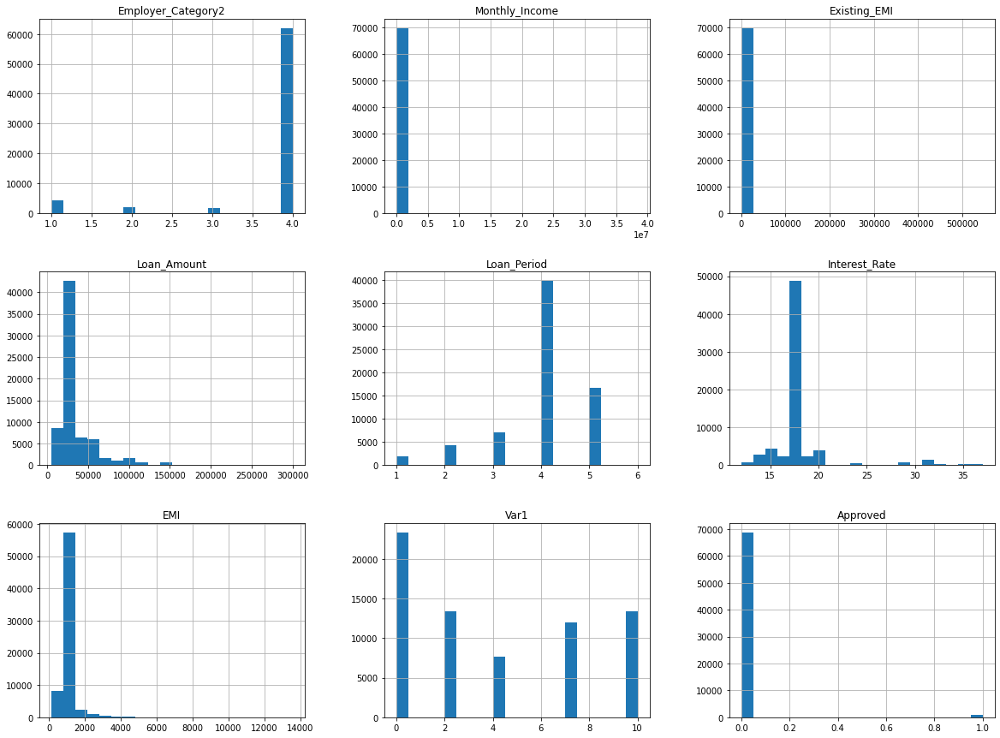

In [26]:
num_bins = 20
cleaned_train.hist(bins = num_bins, figsize=(20,15))

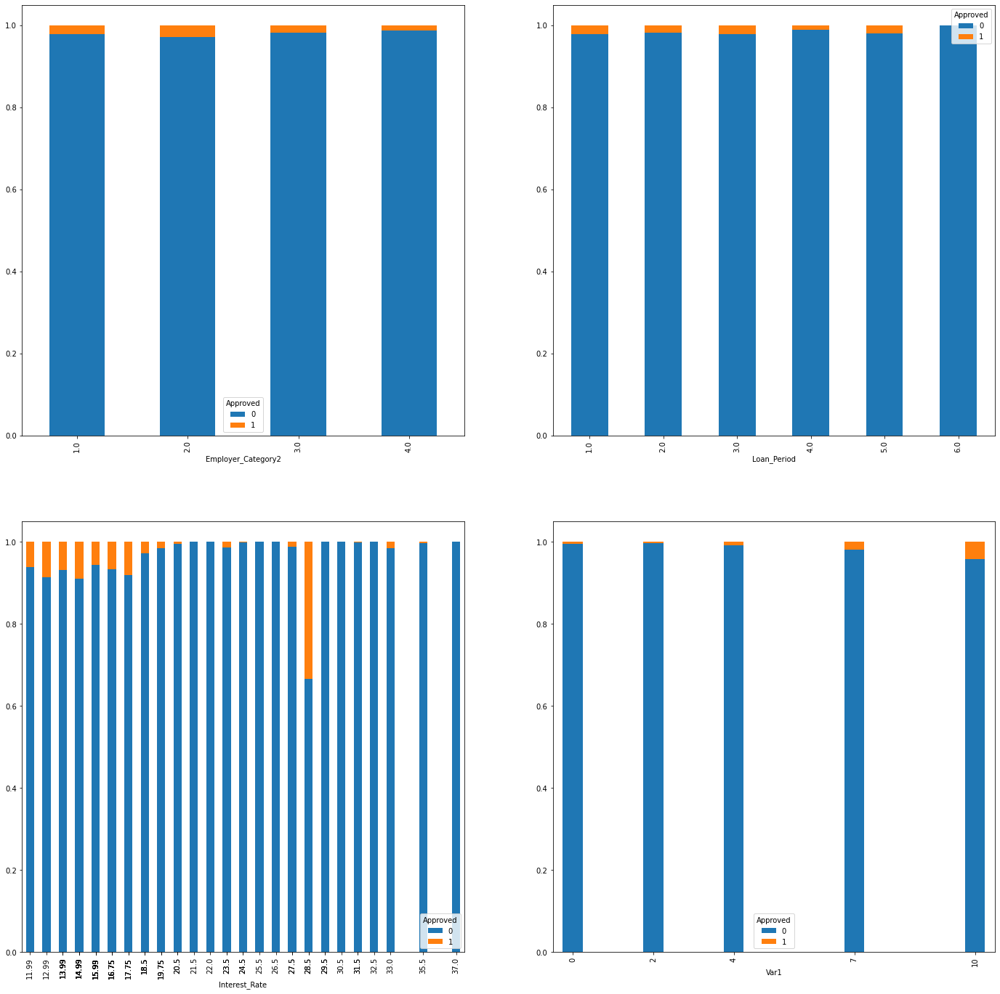

In [27]:
#Approved cases with reference to employer category, loan period, interest rate, var1 

cat1_col = ['Employer_Category2','Loan_Period','Interest_Rate','Var1']
fig, axes = plt.subplots(2, 2, figsize=(24, 24))        
for ax, c in zip(axes.ravel(), cat1_col):
#     cleaned_train[c].value_counts().plot.bar(ax=ax, title=c)
    cat=pd.crosstab(cleaned_train[c],cleaned_train['Approved'])
    cat.div(cat.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True, ax=ax)

In [28]:
# # Approved cases with reference to loan amount, monthly income, existing_EMI and EMI
# import plotly.express as px
# cat2_col = ['Monthly_Income','Existing_EMI','EMI']
# temp = cleaned_train.copy()
# # print(temp.head())
# temp['Loan_Amount'] = np.log(temp['Loan_Amount'])
# for c in cat2_col:
#     temp[c] = np.log(temp[c])
#     fig=px.scatter(temp, x='Loan_Amount',y=c,color="Approved")
#     fig.show()

In [29]:
#categorical data encoding
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
def encode(df):
    for col in df.columns:
        if df.loc[:,col].dtype==object:
            df.loc[:,col] = LabelEncoder().fit_transform(df.loc[:,col])
    return df
cleaned_train = encode(cleaned_train)        
cleaned_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69713 entries, 0 to 69712
Data columns (total 22 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ID                                   69713 non-null  int32  
 1   Gender                               69713 non-null  int32  
 2   DOB                                  69713 non-null  int32  
 3   Lead_Creation_Date                   69713 non-null  int32  
 4   City_Code                            69713 non-null  int32  
 5   City_Category                        69713 non-null  int32  
 6   Employer_Code                        69713 non-null  int32  
 7   Employer_Category1                   69713 non-null  int32  
 8   Employer_Category2                   69713 non-null  float64
 9   Monthly_Income                       69713 non-null  float64
 10  Customer_Existing_Primary_Bank_Code  69713 non-null  int32  
 11  Primary_Bank_Type           

In [30]:
eco_train = encode(eco_train)        
eco_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69713 entries, 0 to 69712
Data columns (total 28 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ID                                   69713 non-null  int32  
 1   Gender                               69713 non-null  int32  
 2   DOB                                  69713 non-null  int32  
 3   Lead_Creation_Date                   69713 non-null  int32  
 4   City_Code                            69713 non-null  int32  
 5   City_Category                        69713 non-null  int32  
 6   Employer_Code                        69713 non-null  int32  
 7   Employer_Category1                   69713 non-null  int32  
 8   Employer_Category2                   69713 non-null  float64
 9   Monthly_Income                       69713 non-null  float64
 10  Customer_Existing_Primary_Bank_Code  69713 non-null  int32  
 11  Primary_Bank_Type           

In [31]:

# # Obtain the correlation matrix between features
# correlations = cleaned_train.corr()
# f, ax = plt.subplots(figsize = (20, 10)) # fix the size
# sns.heatmap(correlations, annot = True)

In [32]:
# # Obtain the correlation matrix between features
# correlationsC = eco_train.corr()
# f, ax = plt.subplots(figsize = (20, 10)) # fix the size
# sns.heatmap(correlationsC, annot = True)

In [33]:
from sklearn.preprocessing import StandardScaler
# Scale the dataset
scaler = StandardScaler()
cleaned_train.iloc[:,:-1] = scaler.fit_transform(cleaned_train.iloc[:,:-1])

In [34]:
eco_train.loc[:,eco_train.columns != 'Approved'] = scaler.fit_transform(eco_train.loc[:,eco_train.columns != 'Approved'])

In [35]:
cleaned_train.shape

(69713, 22)

In [36]:
# import pySankey.sankey as sankey

# bins=[0,3000,6000,9000,12000]
# group=['Low','Average','High','Very high']
# train=cleaned_train.copy()
# train['Income_bin']=pd.cut(train['Monthly_Income'],bins,labels=group)
# # Income_bin=pd.crosstab(train['Income_bin'],train['Approved'])
# # Income_bin.div(Income_bin.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True)
# # plt.xlabel('Monthly Income Tier')
# # plt.ylabel('Normalized')
# train['Income_bin'].fillna(train['Income_bin'].mode()[0], inplace=True)
# sankey.sankey(left=train['Income_bin'], right=train['Approved'], aspect=20,
#     fontsize=16, figure_name='Income to approved cases')
# sankey.sankey(left=train['Var1'], right=train['Approved'], aspect=20,
#     fontsize=16, figure_name='Var1 to approved cases')

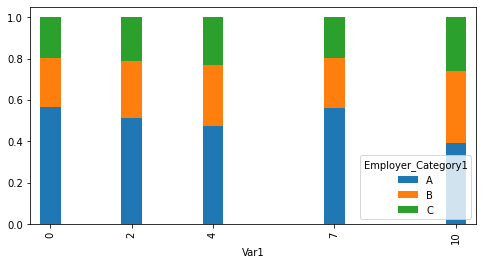

In [37]:
temp=df_train.copy()
emp=pd.crosstab(temp['Var1'],temp['Employer_Category1'])
emp.div(emp.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,4))
plt.show()

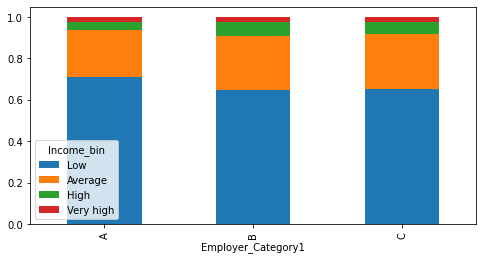

In [38]:
bins=[0,3000,6000,9000,12000]
group=['Low','Average','High','Very high']
temp['Income_bin']=pd.cut(temp['Monthly_Income'],bins,labels=group)
temp['Income_bin'].fillna(temp['Income_bin'].mode()[0], inplace=True)
emp=pd.crosstab(temp['Employer_Category1'],temp['Income_bin'])
emp.div(emp.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,4))
plt.show()

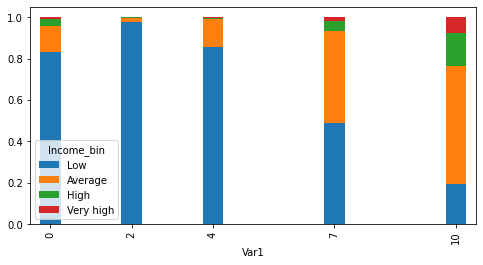

In [39]:
# bins=[0,3000,6000,9000,12000]
# group=['Low','Average','High','Very high']
# temp['Income_bin']=pd.cut(temp['Monthly_Income'],bins,labels=group)
# temp['Income_bin'].fillna(temp['Income_bin'].mode()[0], inplace=True)
iemp=pd.crosstab(temp['Var1'],temp['Income_bin'])
iemp.div(iemp.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,4))
plt.show()

# Using imblearn oversample technique: SMOTE

In [40]:
#Encode categorical dataset
def encode(df):
    for col in df.columns:
        if df.loc[:,col].dtype==object:
            df.loc[:,col] = LabelEncoder().fit_transform(df.loc[:,col])
    return df
cleaned_train = encode(cleaned_train)        
cleaned_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69713 entries, 0 to 69712
Data columns (total 22 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ID                                   69713 non-null  float64
 1   Gender                               69713 non-null  float64
 2   DOB                                  69713 non-null  float64
 3   Lead_Creation_Date                   69713 non-null  float64
 4   City_Code                            69713 non-null  float64
 5   City_Category                        69713 non-null  float64
 6   Employer_Code                        69713 non-null  float64
 7   Employer_Category1                   69713 non-null  float64
 8   Employer_Category2                   69713 non-null  float64
 9   Monthly_Income                       69713 non-null  float64
 10  Customer_Existing_Primary_Bank_Code  69713 non-null  float64
 11  Primary_Bank_Type           

In [41]:
# Normalize the dataset with standard scaler normalization techniques
scaler = StandardScaler()
cleaned_train.iloc[:,:-1] = scaler.fit_transform(cleaned_train.iloc[:,:-1])

In [42]:
#split into train test dataset
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
X=cleaned_train.iloc[:,:-1]
y=cleaned_train.iloc[:,-1]

Xc = eco_train.loc[:,eco_train.columns != 'Approved']
yc = eco_train.loc[:,eco_train.columns == 'Approved']

X2, y2 = RandomOverSampler(sampling_strategy=0.25).fit_resample(X, y)
X5, y5 = RandomOverSampler(sampling_strategy=1).fit_resample(X, y)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
X_train2, X_val2, y_train2, y_val2 = train_test_split(X2, y2, test_size=0.2, random_state=42)
X_train5, X_val5, y_train5, y_val5 = train_test_split(X5, y5, test_size=0.2, random_state=42)
X_train5.shape, X_val5.shape

((109908, 21), (27478, 21))

In [84]:
Xc.shape,yc.shape

((69713, 27), (69713, 1))

# Clustering Analysis - to build with more relevant dataset

In [93]:
#use silhouette score to find the optimal number of cluster

from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans

Xrs, yrs = RandomOverSampler(sampling_strategy=50/50).fit_resample(X, y)
segment = pd.concat([Xrs,yrs],axis=1)


range_values = range(2,10)
score_sil = []
max_score = 0
optimal_n = 1
for n_clusters in range_values:
    kmeans = KMeans(n_clusters = n_clusters)
    cluster_labels = kmeans.fit_predict(segment)
#    kmeans.fit(creditcard_df_scaled) # Run with first 7 features only
#    scores_1.append(kmeans.inertia_) # inertia will give you the value of WCSS
    silhouette_avg = silhouette_score(segment, cluster_labels)
    if max_score<silhouette_avg:
        max_score=silhouette_avg
        optimal_n = n_clusters
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    score_sil.append(silhouette_avg)
print(f'\nMaximum silhouette_score is {max_score}, optimal cluster: {optimal_n}')


For n_clusters = 2 The average silhouette_score is : 0.14212704547060923
For n_clusters = 3 The average silhouette_score is : 0.1232828049833737
For n_clusters = 4 The average silhouette_score is : 0.11696900288943596
For n_clusters = 5 The average silhouette_score is : 0.12294156819529063
For n_clusters = 6 The average silhouette_score is : 0.1190975412682313
For n_clusters = 7 The average silhouette_score is : 0.11988129785537426
For n_clusters = 8 The average silhouette_score is : 0.1255222624668005
For n_clusters = 9 The average silhouette_score is : 0.12001107623352153

Maximum silhouette_score is 0.14212704547060923, optimal cluster: 2


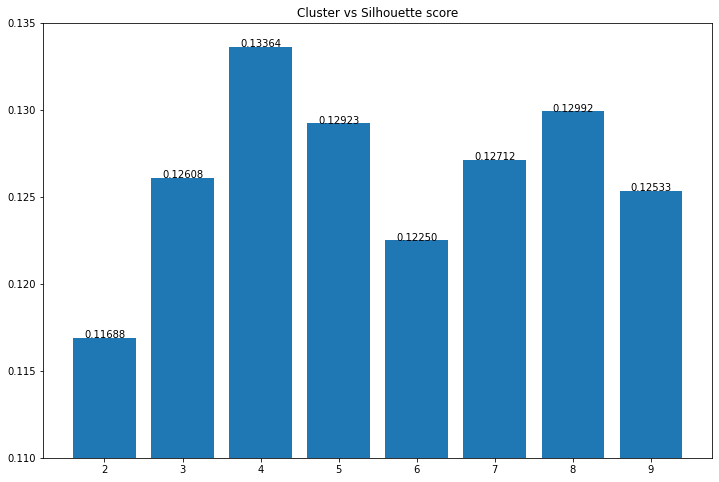

In [37]:
plt.figure(figsize=(12,8))
plt.bar(range_values, score_sil)
plt.title('Cluster vs Silhouette score')
plt.ylim(0.11,0.135)
for xl,yl in zip(range_values,score_sil):
    label = f"{yl:.5f}"
    plt.annotate(label,
                 (xl,yl), # this is the point to label
                 ha='center') # horizontal alignment can be left, right or center

In [94]:
# optimal_n = 4
kmeans = KMeans(optimal_n)
kmeans.fit(segment)
labels = kmeans.labels_ # labels (cluster) associated to each data point

In [39]:
#save randomforest classifier model

import pickle

with open('Kmeans_model.pkl', 'wb') as f:
    pickle.dump(kmeans, f)
## Load model    
#pickle.load('Kmeans_model.pkl')

In [95]:
kmeans.cluster_centers_.shape

(4, 22)

In [96]:
cluster_centers = pd.DataFrame(data = kmeans.cluster_centers_, columns = [segment.columns])
cluster_centers

,ID,Gender,DOB,Lead_Creation_Date,City_Code,City_Category,Employer_Code,Employer_Category1,Employer_Category2,Monthly_Income,...,Contacted,Source,Source_Category,Existing_EMI,Loan_Amount,Loan_Period,Interest_Rate,EMI,Var1,Approved
0,-0.003065,0.678538,-0.005687,-0.036713,-0.113062,-0.145287,-0.073316,0.194906,-0.039089,0.000043,...,0.734689,-0.112104,-0.137246,0.084422,-0.583945,-1.686262,-0.225916,-0.242472,0.992298,0.584548
1,-0.027277,-1.158476,0.038853,0.009300,0.003471,-0.034042,-0.020360,0.064538,-0.041331,-0.007269,...,-1.288630,-0.002649,-0.046948,0.300421,-0.240070,0.070433,-0.069999,-0.123354,-0.530991,0.315829
2,-0.014033,0.655204,0.011325,0.155263,-0.244081,-0.330180,-0.199874,0.419770,-0.374368,0.062082,...,0.734689,-0.086042,0.076616,0.074387,2.831821,0.345227,-1.086399,3.493365,1.194156,0.784952
3,0.001582,0.688105,-0.042001,-0.070130,-0.112676,-0.081081,-0.136758,0.159550,-0.080436,-0.003361,...,0.734689,-0.082750,0.001314,0.014750,0.357717,0.688048,-0.162164,-0.112163,0.660328,0.517335


In [97]:
labels.shape # labels associated to each data point

(137386,)

In [98]:
pd.DataFrame({'Cluster': labels}, index = segment.index).value_counts()

Cluster
3          59016
1          37267
0          29303
2          11800
dtype: int64

In [99]:
# concatenate the clusters labels to our original dataframe
# creditcard_df_cluster = pd.concat([creditcard_df, pd.DataFrame({'cluster': y_kmeans})])
cluster_train = segment.copy()
cluster_train['Cluster'] = pd.DataFrame({'Cluster': labels}, index = cluster_train.index)

cluster_train.head()

,ID,Gender,DOB,Lead_Creation_Date,City_Code,City_Category,Employer_Code,Employer_Category1,Employer_Category2,Monthly_Income,...,Source,Source_Category,Existing_EMI,Loan_Amount,Loan_Period,Interest_Rate,EMI,Var1,Approved,Cluster
0,-1.344039,-1.158530,0.975678,-0.155834,-0.367192,-0.577425,1.647133,-0.842184,0.334485,-0.020726,...,-0.769925,1.235708,-0.157655,-0.233881,0.072591,-0.115643,-0.118697,-1.033845,0,1
1,-1.281777,0.863163,-0.788725,-1.385739,-0.340032,-0.577425,-0.912073,1.674262,-3.487297,-0.012144,...,-0.769925,1.235708,-0.157655,-0.645512,-2.130523,-1.532169,-0.090918,1.584514,0,0
2,-1.109697,0.863163,-0.453684,0.291404,1.316753,2.044304,-0.464099,1.674262,0.334485,-0.019296,...,1.267706,-0.932834,-0.157655,0.383565,0.072591,-0.115643,-0.118697,-1.033845,0,3
3,-0.960475,0.863163,1.661106,-0.826692,6.096986,2.044304,-0.555599,-0.842184,0.334485,-0.012144,...,1.267706,-0.932834,-0.157655,2.318228,1.174149,-0.115643,-0.118697,0.799006,0,3
4,-0.847677,0.863163,0.502208,0.403213,-0.353612,-0.577425,-0.756951,-0.842184,0.334485,0.025049,...,0.180969,-0.932834,0.935153,0.589380,-2.130523,-0.115643,-0.118697,1.584514,0,0


In [52]:
#interactive plot of balance vs purchase, with group color based on individual cluster
import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()

# Ele1 = cluster_train['DOB']
# Ele2 = cluster_train['Loan_Amount']

Ele1 = cluster_train['Approved']
Ele2 = cluster_train['EMI']


fig = px.scatter(
    cluster_train,
    Ele1,
    Ele2,
    color="Cluster"
)
fig.show()

In [100]:
from sklearn.decomposition import PCA

In [101]:
# Obtain the principal components
pca = PCA(n_components = 2)
principal_comp = pca.fit_transform(segment)
principal_comp

array([[-1.89342953,  1.56883014],
       [ 0.94742662, -3.49904903],
       [-0.69035273,  0.77714327],
       ...,
       [-1.32659549, -1.93470811],
       [ 6.63451613,  2.16777212],
       [ 0.55692895, -1.5758672 ]])

In [102]:
# Create a dataframe with the two components
pca_df = pd.DataFrame(data = principal_comp, columns = ['pca1', 'pca2'])
pca_df.head()

,pca1,pca2
0,-1.893430,1.568830
1,0.947427,-3.499049
2,-0.690353,0.777143
3,0.342900,2.336548
4,0.459881,-1.605947


In [103]:
# Concatenate the clusters labels to the dataframe
pca_df = pd.concat([pca_df, pd.DataFrame({'Cluster': labels})], axis = 1)
pca_df.head()

,pca1,pca2,Cluster
0,-1.893430,1.568830,1
1,0.947427,-3.499049,0
2,-0.690353,0.777143,3
3,0.342900,2.336548,3
4,0.459881,-1.605947,0


In [107]:
pca_df = pd.concat([pca_df,cluster_train['Approved']], axis=1)
pca_df.head()

,pca1,pca2,Cluster,Approved
0,-1.893430,1.568830,1,0
1,0.947427,-3.499049,0,0
2,-0.690353,0.777143,3,0
3,0.342900,2.336548,3,0
4,0.459881,-1.605947,0,0


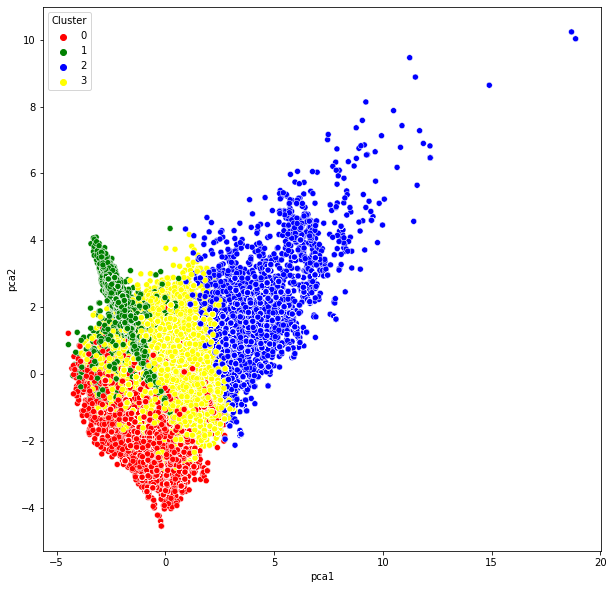

In [104]:
plt.figure(figsize = (10,10))
ax = sns.scatterplot(x='pca1', y='pca2', hue="Cluster", data = pca_df, palette = ['red','green','blue',
                                                                             'yellow'])

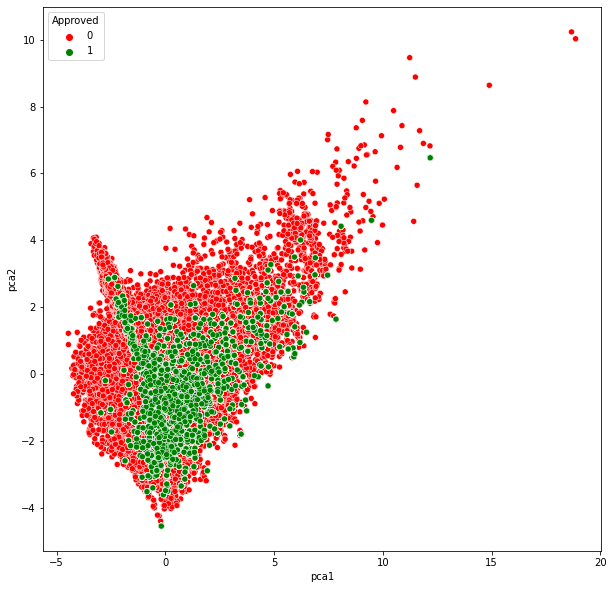

In [108]:
plt.figure(figsize = (10,10))
ax = sns.scatterplot(x='pca1', y='pca2', hue="Approved", data = pca_df, palette = ['red','green'])

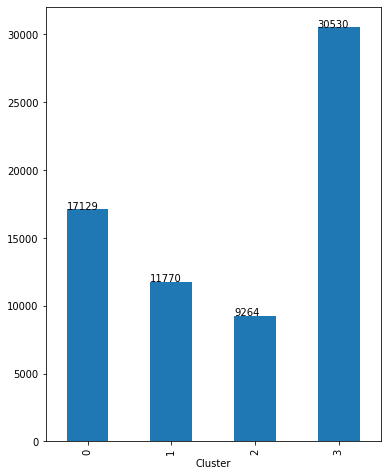

In [115]:
ax = pca_df.groupby(by='Cluster')['Approved'].sum().plot(kind='bar', figsize=(6,8))
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()))

In [142]:
# #Train with DBSCAN Clustering
# from sklearn.cluster import DBSCAN
# features = segment
# clustering = DBSCAN(eps=3, min_samples=1000).fit(features)

In [238]:
# pd.DataFrame({'Cluster_DB': clustering.labels_}, index = segment.index).value_counts()

In [239]:
# cluster_train['Cluster_DB'] = pd.DataFrame({'Cluster_DB': clustering.labels_}, index = cluster_train.index)
# DBEle1 = cluster_train['Approved']
# DBEle2 = cluster_train['Cluster_DB']

# fig = px.scatter(
#     cluster_train,
#     DBEle1,
#     DBEle2,
#     color="Cluster_DB"
# )
# fig.show()

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity=1000, random_state=0)
tsne_scale_results = tsne.fit_transform(cluster_train.iloc[:,:-1])
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=['tsne1', 'tsne2'])


<AxesSubplot:xlabel='tsne1', ylabel='tsne2'>

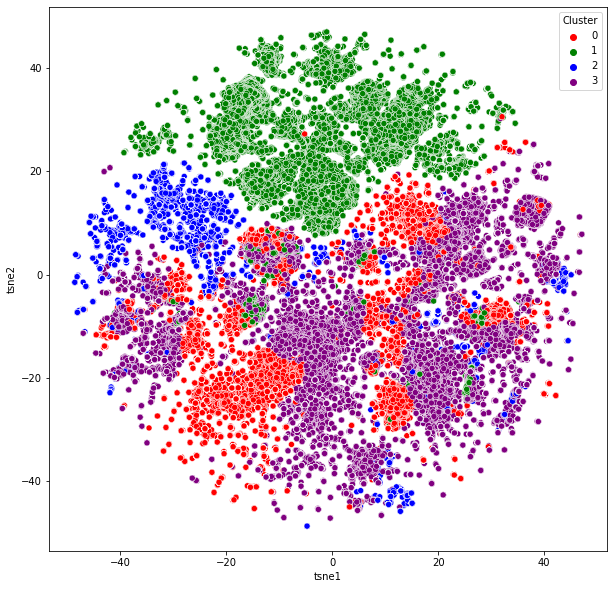

In [121]:
tsne_results = pd.concat([tsne_df_scale,cluster_train.iloc[:,-1],cluster_train['Approved']], axis=1)
tsne_results.head()
# sns.FacetGrid(tsne_results, hue='Cluster',height=8).map(plt.scatter,'tsne1', 'tsne2')
plt.figure(figsize = (10,10))
sns.scatterplot(x='tsne1', y='tsne2', hue="Cluster", data = tsne_results, palette = ['red','green','blue','purple'])

<AxesSubplot:xlabel='tsne1', ylabel='tsne2'>

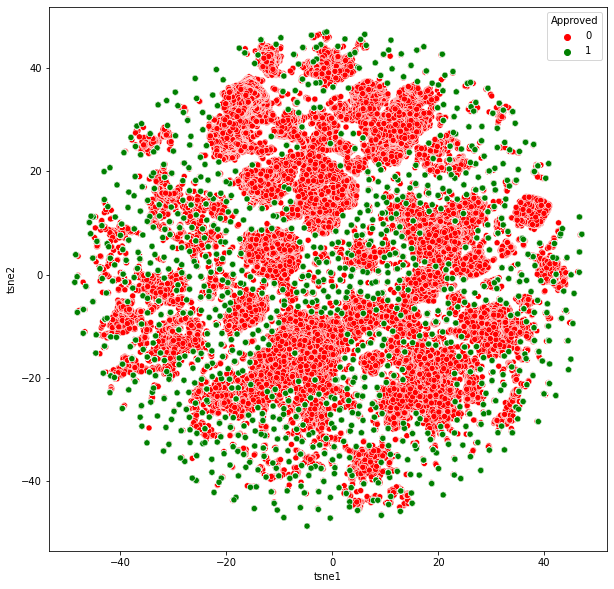

In [122]:
plt.figure(figsize = (10,10))
sns.scatterplot(x='tsne1', y='tsne2', hue="Approved", data = tsne_results, palette = ['red','green'])

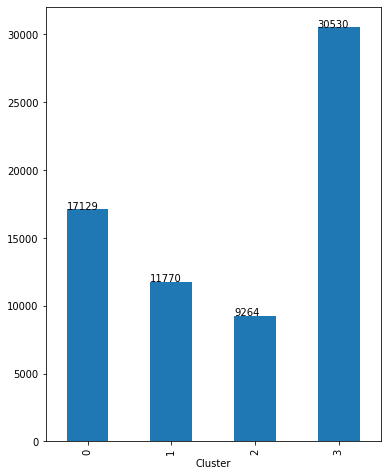

In [123]:
ax = tsne_results.groupby(by='Cluster')['Approved'].sum().plot(kind='bar', figsize=(6,8))
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()))

## Build Random Forest Classifier

In [53]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, KFold
from time import time
from sklearn.metrics import classification_report
import pickle

rfc = RandomForestClassifier(max_depth=2, random_state=0)
print('Model training in progress...')
start = time()
kfold = KFold(n_splits=5, shuffle=True, random_state=12)
parameters = {'n_estimators': [4, 6, 9], 'max_features': ['log2', 
'sqrt','auto'],'criterion': ['entropy', 'gini'], 'max_depth': [2, 
 3, 5, 10], 'min_samples_split': [2, 3, 5],
'min_samples_leaf': [1,5,8] }

grid_RF=GridSearchCV(rfc,param_grid=parameters,scoring="f1_macro",cv=kfold)
grid_RF = grid_RF.fit(X_train, y_train)
rfc = grid_RF.best_estimator_

print(f'Training completed, use {(time()-start):.2} sec')
print(rfc)

Model training in progress...
Training completed, use 5e+02 sec
RandomForestClassifier(max_depth=10, max_features='log2', min_samples_split=5,
                       n_estimators=4, random_state=0)


In [58]:
X=cleaned_train.iloc[:,:-1]
y=cleaned_train.iloc[:,-1]
X.shape,y.shape

((69713, 21), (69713,))

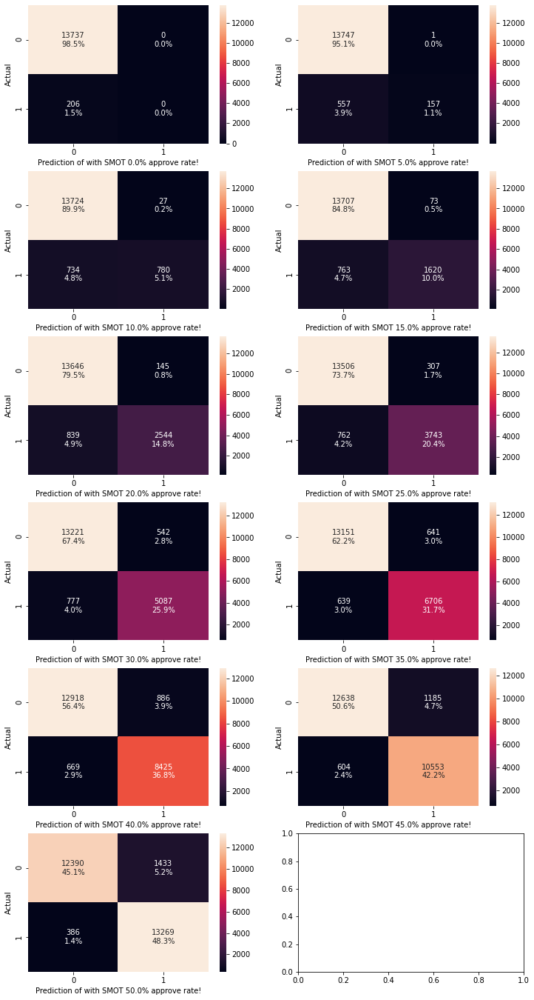

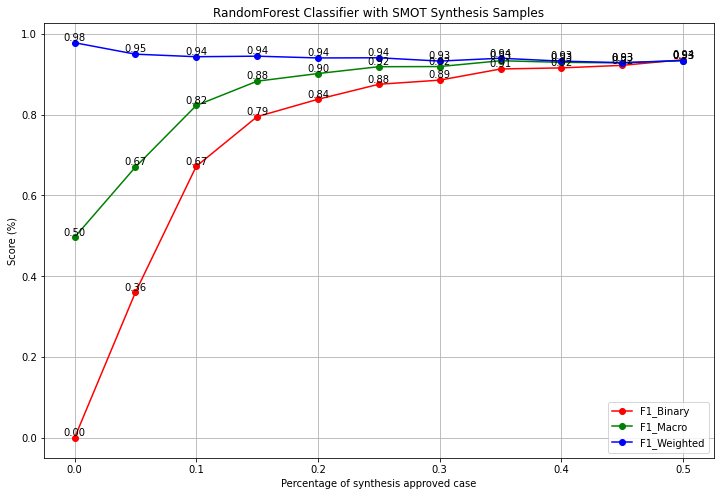

In [90]:
from sklearn import metrics
f1_bi = []
f1_macr=[]
f1_weig=[]
step = np.arange(0.0,0.55,0.05)

fig, axes = plt.subplots(6, 2, figsize=(12, 24))
for ax, r in zip(axes.ravel(), step):
    if r==0.0:
        Xr,yr=X,y
    else:
        Xr,yr = SMOTE(sampling_strategy=r/(1-r)).fit_resample(X, y)
#     print(Xr.shape)
#     print(yr.shape)    
    X_train, X_val, y_train, y_val = train_test_split(Xr, yr, test_size=0.2, random_state=42)
    rfcs = RandomForestClassifier(max_depth=10, max_features='log2', n_estimators=9,random_state=0)
    rfcs.fit(X_train,y_train)
    cm_test = metrics.confusion_matrix(y_val, rfcs.predict(X_val), labels=[0,1])
    group_counts = [f'{value:d}' for value in cm_test.flatten()]
    group_percentages = [f'{value:.1%}' for value in cm_test.flatten()/np.sum(cm_test)]
    labels = [f'{v1}\n{v2}'for v1, v2 in zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    s=sns.heatmap(cm_test, annot=labels,fmt='',ax=ax)
#     s=sns.heatmap(cm_test,annot=True,ax=ax)
    s.set_xlabel(f'Prediction of with SMOT {r*100:.1f}% approve rate!')
    s.set_ylabel('Actual')
    with open(f'RFC_model_{r:.2f}.pkl', 'wb') as f:
        pickle.dump(rfcs, f)
    f1_bi.append(metrics.f1_score(y_val,rfcs.predict(X_val), average='binary'))
    f1_macr.append(metrics.f1_score(y_val,rfcs.predict(X_val), average='macro'))
    f1_weig.append(metrics.f1_score(y_val,rfcs.predict(X_val), average='weighted'))
    
plt.figure(figsize=(12,8))
plt.plot(step,f1_bi, 'ro-', label='F1_Binary')
for xf1,yf1 in zip(step,f1_bi):
    label = f"{yf1:.2f}"
    plt.annotate(label,
                 (xf1,yf1), # this is the point to label
                 va='bottom',
                 ha='center') # horizontal alignment can be left, right or center
plt.plot(step,f1_macr, 'go-', label='F1_Macro')
for xf2,yf2 in zip(step,f1_macr):
    label = f"{yf2:.2f}"
    plt.annotate(label,
                 (xf2,yf2), # this is the point to label
                 va='bottom', # horizontal alignment can be left, right or center
                 ha='center') # horizontal alignment can be left, right or center
plt.plot(step,f1_weig, 'bo-', label='F1_Weighted')
for xf3,yf3 in zip(step,f1_weig):
    label = f"{yf3:.2f}"
    plt.annotate(label,
                 (xf3,yf3), # this is the point to label
                 va='bottom',
                 ha='center') # horizontal alignment can be left, right or center
plt.xlabel('Percentage of synthesis approved case')
plt.ylabel(f'Score (%)')
plt.title('RandomForest Classifier with SMOT Synthesis Samples')
plt.legend()
plt.grid()
plt.show()

In [44]:
#Accuracy without any oversampler
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
rfc = RandomForestClassifier(max_depth=10, max_features='log2', min_samples_split=5, n_estimators=4, random_state=0)
rfc.fit(X_train,y_train.values.reshape(len(y_train),))
compare_no_oversampler={'RFC':metrics.f1_score(y_val,rfc.predict(X_val), average='macro')}
compare_no_oversampler

{'RFC': 0.5010041362982539}

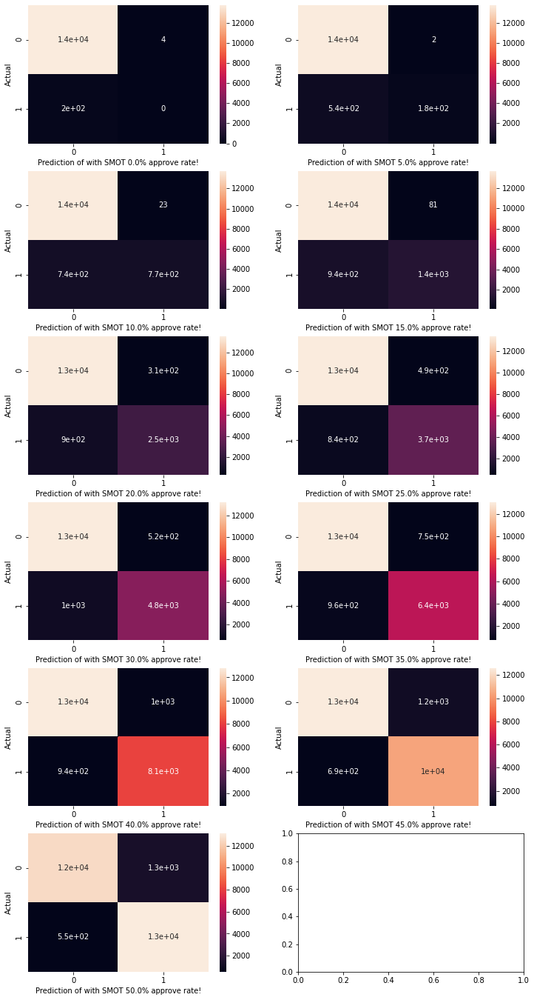

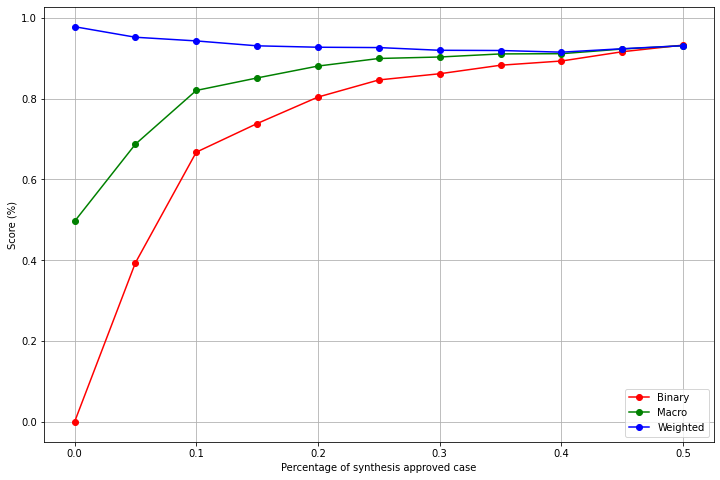

In [60]:
#plot with macro eco data

ef1_bi = []
ef1_macr=[]
ef1_weig=[]

fig, axes = plt.subplots(6, 2, figsize=(12, 24))
for ax, r in zip(axes.ravel(), np.arange(0.0,0.55,0.05)):
    if r==0.0:
        Xrc,yrc=Xc,yc
    else:
        Xrc,yrc = SMOTE(sampling_strategy=r/(1-r)).fit_resample(Xc, yc)
        
    X_train, X_val, y_train, y_val = train_test_split(Xrc, yrc, test_size=0.2, random_state=42)
    rfcs = RandomForestClassifier(max_depth=10, max_features='log2', min_samples_split=5, n_estimators=4, random_state=0)
    rfcs.fit(X_train,y_train.values.reshape(len(y_train),))
    cm_test = metrics.confusion_matrix(y_val, rfcs.predict(X_val), labels=[0,1])
    s=sns.heatmap(cm_test,annot=True,xticklabels=[0,1],yticklabels=[0,1], ax=ax)
    s.set_xlabel(f'Prediction of with SMOT {r*100:.1f}% approve rate!')
    s.set_ylabel('Actual')
    with open(f'RFC_model_{r:.2f}c.pkl', 'wb') as f:
        pickle.dump(rfcs, f)
    ef1_bi.append(metrics.f1_score(y_val,rfcs.predict(X_val), average='binary'))
    ef1_macr.append(metrics.f1_score(y_val,rfcs.predict(X_val), average='macro'))
    ef1_weig.append(metrics.f1_score(y_val,rfcs.predict(X_val), average='weighted'))
    
plt.figure(figsize=(12,8))
plt.plot(np.arange(0,0.55,0.05),ef1_bi, 'ro-', label='Binary')
plt.plot(np.arange(0,0.55,0.05),ef1_macr, 'go-', label='Macro')
plt.plot(np.arange(0,0.55,0.05),ef1_weig, 'bo-', label='Weighted')
plt.xlabel('Percentage of synthesis approved case')
plt.ylabel(f'Score (%)')
plt.legend()
plt.grid()
plt.show()

In [224]:
# #transform categorical into labels
# df_test = pd.read_csv(r'C:\Users\Acer\OneDrive - DigiPen Institute of Technology\Desktop\work\Weekly Summary\Banking and Leads Conversion/test_loan/test.csv', delimiter=',')
# t_test = df_test.copy()
# t_test = t_test.dropna()
# t_test = encode(t_test)
# t_test = scaler.fit_transform(t_test)


In [226]:
# rfc = pickle.load(open(f'RFC_model_0.20.pkl', 'rb'))
# y_test = rfc.predict(t_test)
# ax=sns.histplot(y_test)
# for p in ax.patches:
#     ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()))
# # print(np.unique(y_test,return_counts=True))

In [228]:
# from sklearn import metrics
# for c in ['00','10','19','29','38','48']:
#     rfc = pickle.load(open(f'RFC_model_0.{c}.pkl', 'rb'))
#     if c=='00':
#         Xr,yr=X,y
#     else:
#         Xr,yr = SMOTE(sampling_strategy=float(c)/(100-float(c))).fit_resample(X, y)
#     X_train, X_val, y_train, y_val = train_test_split(Xr, yr, test_size=0.2, random_state=42)
#     cm_test = metrics.confusion_matrix(y_val, rfc.predict(X_val), labels=[0,1])
#     sns.heatmap(cm_test,annot=True,xticklabels=[0,1],yticklabels=[0,1])
#     plt.xlabel(f'Prediction of with SMOT {float(c)}% approve rate!')
#     plt.ylabel('Actual')
#     plt.show()

## Build Support Vector Classifier
- Computational complexity is large: O(s*d^2), will try to do PCA before implementing

In [42]:
#use SVC which utilize 10-fold cross validation and mean to mitigate data imbalance issue
c
Xs,ys = SMOTE(sampling_strategy=35/65).fit_resample(X, y)
        
X_train, X_val, y_train, y_val = train_test_split(Xs, ys, test_size=0.2, random_state=42)

svc = SVC(kernel='poly')
print('Model training in progress...')
start = time()
kfold = KFold(n_splits=5, shuffle=True, random_state=22)
parameters = {'C': [0.1, 10], 'gamma': [0.1,10], 'degree': [1,5],'kernel': ['linear','poly']}
parameters = {'kernel':['poly']}

# grid_svc=GridSearchCV(svc,param_grid=parameters, scoring="f1_macro",cv=kfold)
grid_svc=GridSearchCV(svc, param_grid=parameters, scoring="f1_macro",cv=kfold)
grid_svc = grid_svc.fit(X_train, y_train)
svc = grid_svc.best_estimator_
svc.fit(X_train, y_train)
print(f'Training completed, use {(time()-start):.2} sec')

Model training in progress...
Training completed, use 1.5e+03 sec


In [43]:
svc.get_params().keys()

dict_keys(['C', 'break_ties', 'cache_size', 'class_weight', 'coef0', 'decision_function_shape', 'degree', 'gamma', 'kernel', 'max_iter', 'probability', 'random_state', 'shrinking', 'tol', 'verbose'])

In [45]:
from sklearn.svm import SVC
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
svc = SVC(C=10, kernel='poly', degree=5)
svc.fit(X_train,y_train.values.reshape(len(y_train),))
compare_no_oversampler['SVC']=metrics.f1_score(y_val,svc.predict(X_val), average='macro')
compare_no_oversampler

{'RFC': 0.5010041362982539, 'SVC': 0.49507496197580936}

In [44]:
with open('SVC_model.pkl', 'wb') as f:
    pickle.dump(svc, f)
## Load model    
#pickle.load('SVC_model.pkl')

In [45]:
print(classification_report(y_val, svc.predict(X_val), zero_division=0))

              precision    recall  f1-score   support

           0       0.88      0.88      0.88     13792
           1       0.77      0.78      0.77      7345

    accuracy                           0.84     21137
   macro avg       0.83      0.83      0.83     21137
weighted avg       0.84      0.84      0.84     21137



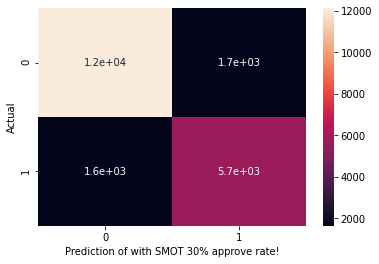

In [46]:
cm_svc = metrics.confusion_matrix(y_val, svc.predict(X_val), labels=[0,1])
sns.heatmap(cm_svc,annot=True,xticklabels=[0,1],yticklabels=[0,1])
plt.xlabel('Prediction of with SMOT 30% approve rate!')
plt.ylabel('Actual')
plt.show()

In [62]:
Xse,yse = SMOTE(sampling_strategy=35/65).fit_resample(Xc, yc)
        
X_train, X_val, y_train, y_val = train_test_split(Xse, yse, test_size=0.2, random_state=42)
svc.fit(X_train, y_train.values.reshape(len(y_train),))


'              precision    recall  f1-score   support\n\n           0       0.91      0.88      0.89     13782\n           1       0.79      0.83      0.81      7355\n\n    accuracy                           0.86     21137\n   macro avg       0.85      0.86      0.85     21137\nweighted avg       0.87      0.86      0.86     21137\n'

In [64]:
print(classification_report(y_val, svc.predict(X_val), zero_division=0))

              precision    recall  f1-score   support

           0       0.91      0.88      0.89     13782
           1       0.79      0.83      0.81      7355

    accuracy                           0.86     21137
   macro avg       0.85      0.86      0.85     21137
weighted avg       0.87      0.86      0.86     21137



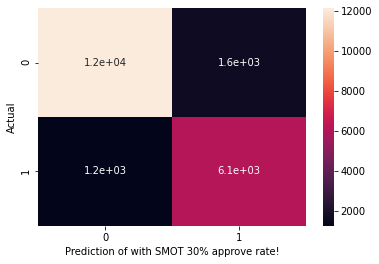

In [65]:
cm_svc = metrics.confusion_matrix(y_val, svc.predict(X_val), labels=[0,1])
sns.heatmap(cm_svc,annot=True,xticklabels=[0,1],yticklabels=[0,1])
plt.xlabel('Prediction of with SMOT 30% approve rate!')
plt.ylabel('Actual')
plt.show()

## Build Neural Network Model for Loan Approval Classification

In [79]:
Xa,ya = SMOTE(sampling_strategy=0).fit_resample(X, y)
        
X_train, X_val, y_train, y_val = train_test_split(Xa, ya, test_size=0.2, random_state=42)

In [96]:
X_train.shape, y_train.shape, X_val.shape, y_val.shape

((55770, 21), (55770,), (13943, 21), (13943,))

In [47]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# define the keras model
ann = Sequential()
ann.add(Dense(16, input_shape=(X_train.shape[1],), activation='relu'))
ann.add(Dense(32, activation='relu'))
ann.add(Dense(16, activation='relu'))
ann.add(Dense(1, activation='relu'))

In [48]:
ann.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16)                352       
_________________________________________________________________
dense_1 (Dense)              (None, 32)                544       
_________________________________________________________________
dense_2 (Dense)              (None, 16)                528       
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 17        
Total params: 1,441
Trainable params: 1,441
Non-trainable params: 0
_________________________________________________________________


In [49]:
#implement callbacks for early stoping
callbacks = [EarlyStopping(monitor='accuracy', patience=20),
             ModelCheckpoint(filepath='ann.h5', monitor='accuracy', save_best_only=True)]
opt = tf.keras.optimizers.Adam(learning_rate=0.001)
ann.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])

In [50]:
# fit the keras model on the dataset
history=ann.fit(X_train, y_train, epochs=200, batch_size=len(X_train)//5000, callbacks=callbacks, validation_data = (X_val,y_val))

Epoch 1/200


InternalError:  Blas GEMM launch failed : a.shape=(11, 21), b.shape=(21, 16), m=11, n=16, k=21
	 [[node sequential/dense/MatMul (defined at <ipython-input-50-719073b23141>:2) ]] [Op:__inference_train_function_834]

Function call stack:
train_function


In [108]:
history=hitstory

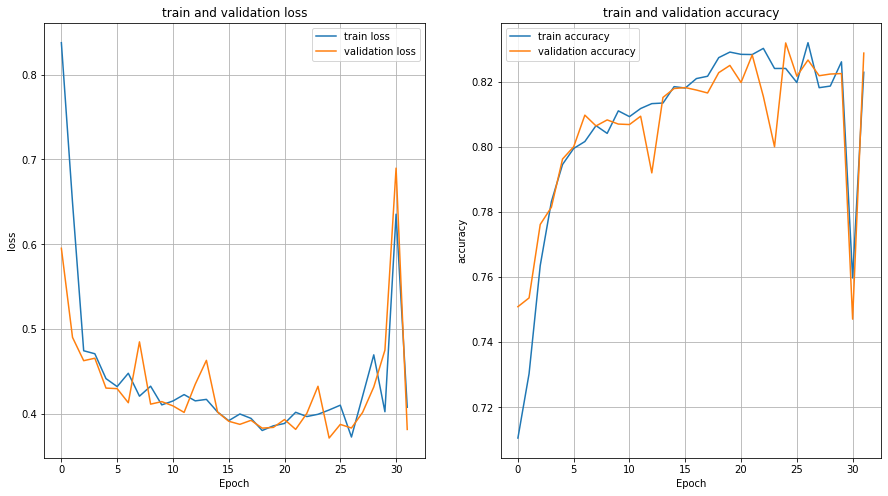

In [110]:

def plot_curves():
    fig, axes = plt.subplots(figsize=(15,8),nrows=1, ncols=2)
    # plot training and validation losses
    axes[0].set_title('train and validation loss')
    axes[0].plot(history.history['loss'],  label='train loss')
    axes[0].plot(history.history['val_loss'], label='validation loss')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('loss')
    axes[0].grid()
    axes[0].legend()
    #plot training and validation mae
    axes[1].set_title('train and validation accuracy')
    axes[1].plot(history.history['accuracy'],  label='train accuracy')
    axes[1].plot(history.history['val_accuracy'], label='validation accuracy')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('accuracy')
    axes[1].grid()
    axes[1].legend()
    return

plot_curves()

In [ ]:
compare_no_oversampler['ANN']=metrics.f1_score(y_val,ann.predict_classes(X_val), average='macro')
compare_no_oversampler

In [111]:
#save model
ann.save('ANN_mode.h5')
#load model
# import tensorflow as tf
# ann= tf.keras.models.load_model("my_h5_model.h5")

In [112]:
# evaluate the keras model
_, accuracy = ann.evaluate(X_val, y_val)
print('Accuracy: %.2f' % (accuracy*100))

661/661 [==============================] - 1s 1ms/step - loss: 0.3819 - accuracy: 0.8288
Accuracy: 82.88


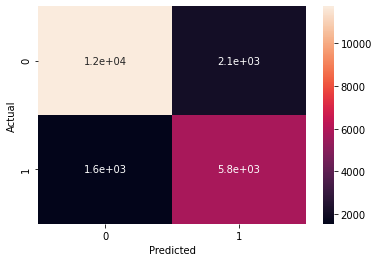

In [113]:
from sklearn import metrics
cm_test = metrics.confusion_matrix(y_val, ann.predict_classes(X_val), labels=[0,1])
sns.heatmap(cm_test,annot=True,xticklabels=[0,1],yticklabels=[0,1])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [68]:
# define the keras model
anne = Sequential()
anne.add(Dense(12, input_shape=(X_train.shape[1],), activation='relu'))
# ann.add(Dense(12, input_shape=(10,21), activation='relu'))
anne.add(Dense(8, activation='relu'))
anne.add(Dense(1, activation='relu'))

In [69]:
anne.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, None, 10, 12)      336       
_________________________________________________________________
dense_4 (Dense)              (None, None, 10, 8)       104       
_________________________________________________________________
dense_5 (Dense)              (None, None, 10, 1)       9         
Total params: 449
Trainable params: 449
Non-trainable params: 0
_________________________________________________________________


In [70]:
Xae,yae = SMOTE(sampling_strategy=35/65.0).fit_resample(Xc, yc)
        
X_train, X_val, y_train, y_val = train_test_split(Xae, yae, test_size=0.2, random_state=42)

In [72]:
# # compile the keras model
# anne.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
# # fit the keras model on the dataset
# anne.fit(X_train, y_train, epochs=100, batch_size=10)

# compile the keras model
callbacks = [EarlyStopping(monitor='accuracy', patience=5),
             ModelCheckpoint(filepath='ann.h5', monitor='accuracy', save_best_only=True)]
opt = tf.keras.optimizers.Adam(learning_rate=0.01)
anne.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
# fit the keras model on the dataset
history = anne.fit(X_train, y_train, epochs=100, callbacks=callbacks, validation_data = (X_val,y_val))

Epoch 1/100
8455/8455 [==============================] - 18s 2ms/step - loss: 0.6767 - accuracy: 0.7103
Epoch 2/100
8455/8455 [==============================] - 16s 2ms/step - loss: 0.5238 - accuracy: 0.7548
Epoch 3/100
8455/8455 [==============================] - 17s 2ms/step - loss: 0.4967 - accuracy: 0.7607
Epoch 4/100
8455/8455 [==============================] - 16s 2ms/step - loss: 0.4635 - accuracy: 0.7791
Epoch 5/100
8455/8455 [==============================] - 16s 2ms/step - loss: 0.4513 - accuracy: 0.7893
Epoch 6/100
8455/8455 [==============================] - 17s 2ms/step - loss: 0.4405 - accuracy: 0.7976 0s - loss: 0.4410 - accura
Epoch 7/100
8455/8455 [==============================] - 15s 2ms/step - loss: 0.4330 - accuracy: 0.8021
Epoch 8/100
8455/8455 [==============================] - 15s 2ms/step - loss: 0.4295 - accuracy: 0.8040
Epoch 9/100
8455/8455 [==============================] - 14s 2ms/step - loss: 0.4214 - accuracy: 0.8066
Epoch 10/100
8455/8455 [=============

In [60]:

# compare_no_oversampler['ANN']=metrics.f1_score(y_val,ann.predict(X_val), average='macro')
compare_no_oversampler['ANN'] = 0.499876
compare_no_oversampler

{'RFC': 0.5010041362982539,
 'SVC': 0.49507496197580936,
 'XGB': 0.49507496197580936,
 'ANN': 0.499876}

In [76]:
# evaluate the keras model
_, accuracy = anne.evaluate(X_val, y_val)
print('Accuracy: %.2f' % (accuracy*100))

661/661 [==============================] - 1s 1ms/step - loss: 0.3584 - accuracy: 0.8424
Accuracy: 84.24


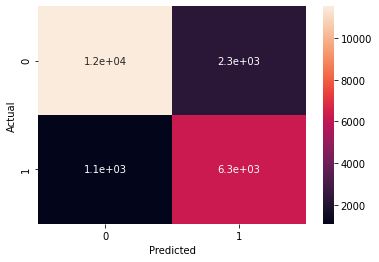

In [78]:
from sklearn import metrics
cm_test = metrics.confusion_matrix(y_val, anne.predict_classes(X_val), labels=[0,1])
sns.heatmap(cm_test,annot=True,xticklabels=[0,1],yticklabels=[0,1])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## XGBoost Classifier

In [61]:
from xgboost import XGBClassifier

Xx,yx = SMOTE(sampling_strategy=35/65.0).fit_resample(X, y)
        
X_train, X_val, y_train, y_val = train_test_split(Xx, yx, test_size=0.2, random_state=42)

In [65]:
xgb = XGBClassifier(n_estimators=50, max_depth=4, use_label_encoder=False, eval_metric='logloss') 
# Or you can use: clf = xgb.XGBClassifier(**param_dist)

xgb.fit(X_train, y_train)

# # Load evals result by calling the evals_result() function
# evals_result = clf.evals_result()

# evals_result

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='logloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=4, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=50, n_jobs=8,
              num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              use_label_encoder=False, validate_parameters=1, verbosity=None)

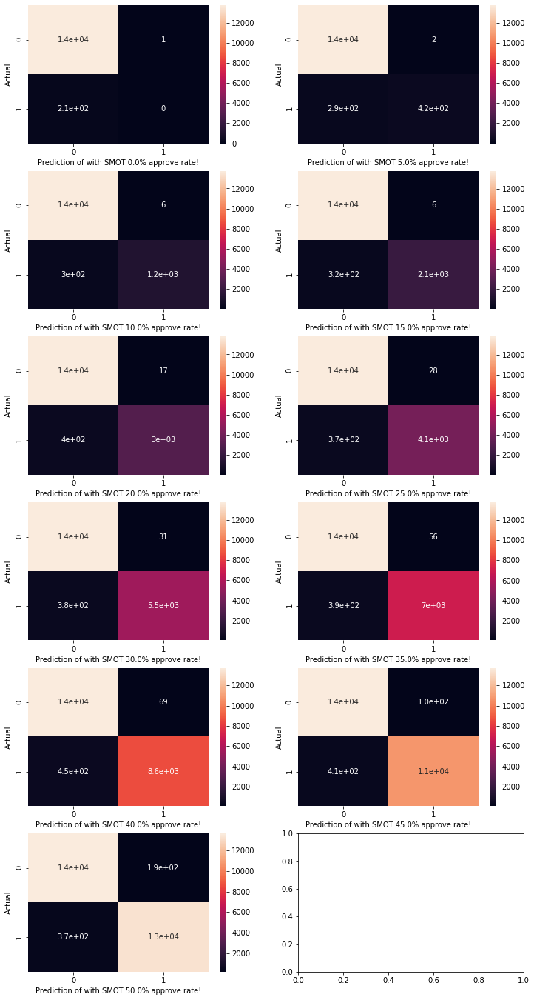

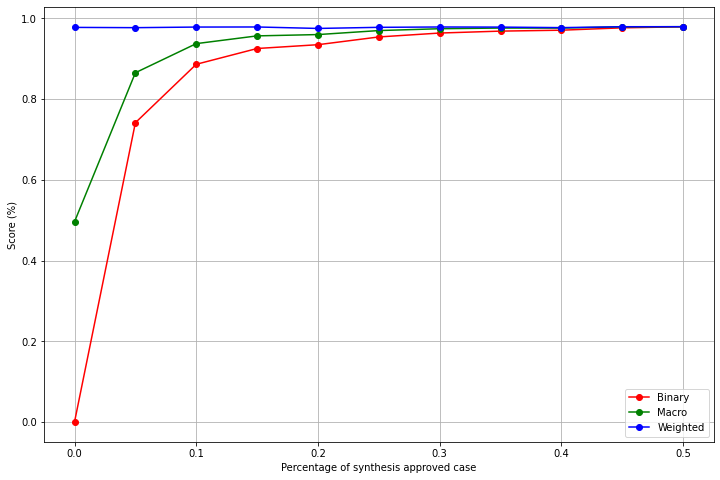

In [66]:
from sklearn import metrics
f1_bi = []
f1_macr=[]
f1_weig=[]

fig, axes = plt.subplots(6, 2, figsize=(12, 24))
for ax, r in zip(axes.ravel(), np.arange(0.0,0.55,0.05)):
    if r==0.0:
        Xr,yr=X,y
    else:
        Xr,yr = SMOTE(sampling_strategy=r/(1-r)).fit_resample(X, y)
        
    X_train, X_val, y_train, y_val = train_test_split(Xr, yr, test_size=0.2, random_state=42)
    xgb = XGBClassifier(n_estimators=50, max_depth=4, use_label_encoder=False, eval_metric='logloss')
    xgb.fit(X_train,y_train)
    cm_test = metrics.confusion_matrix(y_val, xgb.predict(X_val), labels=[0,1])
    s=sns.heatmap(cm_test,annot=True,xticklabels=[0,1],yticklabels=[0,1], ax=ax)
    s.set_xlabel(f'Prediction of with SMOT {r*100:.1f}% approve rate!')
    s.set_ylabel('Actual')
#     with open(f'RFC_model_{r:.2f}.pkl', 'wb') as f:
#         pickle.dump(rfcs, f)
    f1_bi.append(metrics.f1_score(y_val,xgb.predict(X_val), average='binary'))
    f1_macr.append(metrics.f1_score(y_val,xgb.predict(X_val), average='macro'))
    f1_weig.append(metrics.f1_score(y_val,xgb.predict(X_val), average='weighted'))
    
plt.figure(figsize=(12,8))
plt.plot(np.arange(0,0.55,0.05),f1_bi, 'ro-', label='Binary')
plt.plot(np.arange(0,0.55,0.05),f1_macr, 'go-', label='Macro')
plt.plot(np.arange(0,0.55,0.05),f1_weig, 'bo-', label='Weighted')
plt.xlabel('Percentage of synthesis approved case')
plt.ylabel(f'Score (%)')
plt.legend()
plt.grid()
plt.show()

In [67]:
Xx,yx = SMOTE(sampling_strategy=35/65.0).fit_resample(X, y)
        
X_train, X_val, y_train, y_val = train_test_split(Xx, yx, test_size=0.2, random_state=42)

from sklearn.metrics import classification_report
print(classification_report(y_val, xgb.predict(X_val), zero_division=0))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     13792
           1       0.98      0.96      0.97      7345

    accuracy                           0.98     21137
   macro avg       0.98      0.98      0.98     21137
weighted avg       0.98      0.98      0.98     21137



In [71]:
from xgboost import XGBClassifier
xgb = XGBClassifier(n_estimators=50, max_depth=4, use_label_encoder=False, eval_metric='logloss')
xgb.fit(X_train,y_train.values.reshape(len(y_train),))
compare_no_oversampler['XGB']=metrics.f1_score(y_val,xgb.predict(X_val), average='macro')
compare_no_oversampler

{'RFC': 0.5010041362982539,
 'SVC': 0.49507496197580936,
 'XGB': 0.49626070306008163,
 'ANN': 0.499876}

(0.0, 1.0)

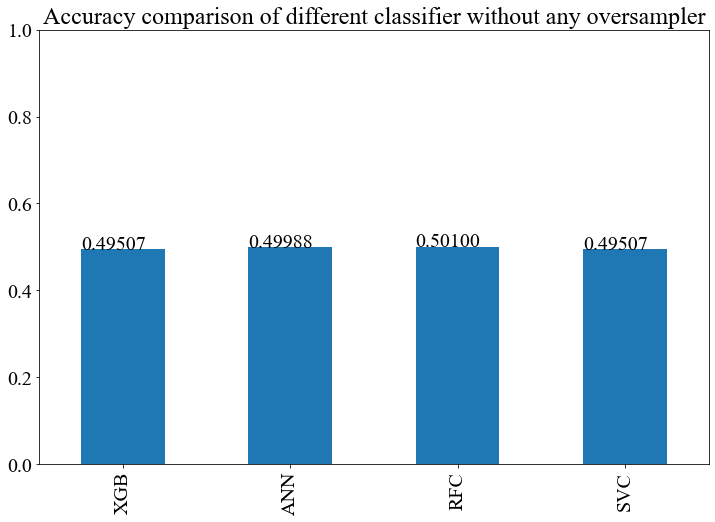

In [70]:
plt.rcParams.update({'font.size': 20, 'font.family': 'Times New Roman'})
compare = {'XGB':compare_no_oversampler['XGB'],'ANN':compare_no_oversampler['ANN'],'RFC':compare_no_oversampler['RFC'],'SVC':compare_no_oversampler['SVC']}
ax = pd.DataFrame.from_dict(compare,orient='index').plot(kind='bar',legend=False, figsize=(12,8))
for p in ax.patches:
    ax.annotate(f'{p.get_height():.5f}', (p.get_x(), p.get_height()))
ax.set_title('Accuracy comparison of different classifier without any oversampler',fontsize=24)
ax.set_ylim(0,1)

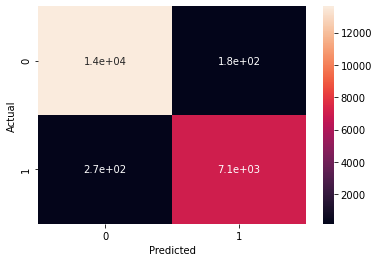

In [68]:
from sklearn import metrics
cm_test = metrics.confusion_matrix(y_val, xgb.predict(X_val), labels=[0,1])
sns.heatmap(cm_test,annot=True,xticklabels=[0,1],yticklabels=[0,1])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

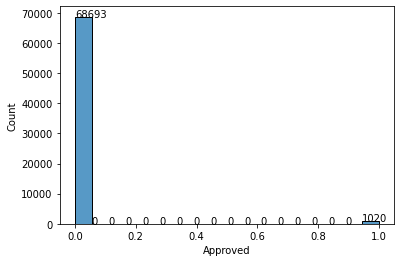

In [39]:
#revisit distrubtion of target values
ax = sns.histplot(y)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()))

In [126]:
X.shape,y.shape

((69713, 21), (69713,))

In [145]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.svm import SVC
import shap
Xr,yr = RandomOverSampler(sampling_strategy=50/50).fit_resample(X, y)
X_train, X_val, y_train, y_val = train_test_split(Xr, yr, test_size=0.2, random_state=42)

# svc = pickle.load(open(f'SVC_model.pkl', 'rb'))
svc = SVC(C=10, kernel='poly', degree=5)
svc.fit(X_train,y_train)

# explainer = shap.TreeExplainer(svc)
# shap_values = explainer.shap_values(X_train)
# shap_values

SVC(C=10, degree=5, kernel='poly')

In [132]:
import time
print('Start building svc model.')
st = time.time()
svc.fit(X_train,y_train)

ent = time.time()
print(f'Training uses {(ent - st):.2f}s')

Start building svc model.
Training uses 10464.60s


In [133]:
svc

SVC(C=10, degree=5, kernel='linear')

In [149]:
plt.rcParams.update({'font.size': 16})
pd.Series(abs(svc.coef_[0]), index=X_train.columns).sort_values(ascending=True).plot(kind='barh', figsize=(12,18))

AttributeError: coef_ is only available when using a linear kernel

In [151]:
from sklearn.inspection import permutation_importance
r = permutation_importance(svc, X_train, y_train, random_state=0)

In [152]:
r.importances_mean

array([0.16228482, 0.11894312, 0.16006296, 0.15733523, 0.02865487,
       0.11197365, 0.13031081, 0.17452597, 0.0884558 , 0.00125014,
       0.09006078, 0.1276231 , 0.08183208, 0.11283073, 0.15104815,
       0.09214616, 0.1451978 , 0.14348364, 0.10144484, 0.12136696,
       0.19756706])

<AxesSubplot:>

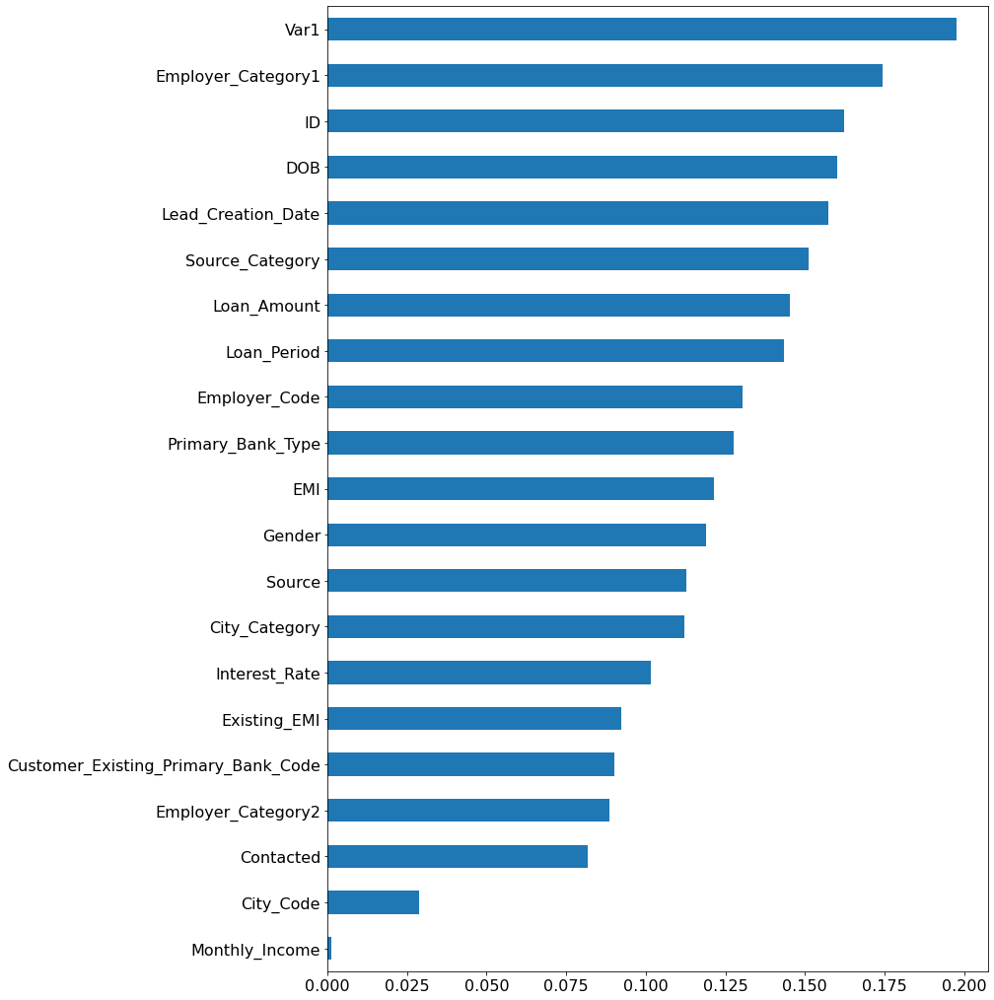

In [153]:
pd.Series(r.importances_mean, index=X_train.columns).sort_values(ascending=True).plot(kind='barh', figsize=(12,18))

In [43]:
import pickle
# with open('svc_50_poly.pkl', 'wb') as f:
#     pickle.dump(svc, f)
with open('svc_50_poly.pkl', 'rb') as f:
    svc1 = pickle.load(f)

In [73]:
X_val.columns.tolist()

['ID',
 'Gender',
 'DOB',
 'Lead_Creation_Date',
 'City_Code',
 'City_Category',
 'Employer_Code',
 'Employer_Category1',
 'Employer_Category2',
 'Monthly_Income',
 'Customer_Existing_Primary_Bank_Code',
 'Primary_Bank_Type',
 'Contacted',
 'Source',
 'Source_Category',
 'Existing_EMI',
 'Loan_Amount',
 'Loan_Period',
 'Interest_Rate',
 'EMI',
 'Var1']

In [ ]:
import shap
X_sample = shap.sample(X_train, 100)
explainer = shap.KernelExplainer(svc1.predict,X_sample)
shap_values = explainer.shap_values(X_sample)
shap.summary_plot(shap_values, X_sample, feature_names = X_sample.columns.tolist())

In [ ]:
shap.summary_plot(shap_values, X_val, feature_names = X_val.columns.tolist())

In [ ]:
shap.initjs()
# for i in range(10):
i=14
shap.force_plot(explainer.expected_value, shap_values[0][i,:] ,X_sample.iloc[i,:],feature_names=X_sample.columns.tolist())

In [146]:
from sklearn.metrics import classification_repo36rt
print(classification_report(y_val, svc.predict(X_val), zero_division=0))

              precision    recall  f1-score   support

           0       0.99      0.94      0.96     13823
           1       0.95      0.99      0.97     13655

    accuracy                           0.97     27478
   macro avg       0.97      0.97      0.97     27478
weighted avg       0.97      0.97      0.97     27478



In [43]:
df_train = pd.read_csv(r'C:\Users\Acer\OneDrive - DigiPen Institute of Technology\Desktop\work\Weekly Summary\Banking and Leads Conversion/train_loan/train.csv', delimiter=',')
df_test = pd.read_csv(r'C:\Users\Acer\OneDrive - DigiPen Institute of Technology\Desktop\work\Weekly Summary\Banking and Leads Conversion/test_loan/test.csv', delimiter=',')

df_train.shape, df_test.shape

((69713, 22), (30037, 21))

In [44]:
df_train.isna().sum()

ID                                         0
Gender                                     0
DOB                                       15
Lead_Creation_Date                         0
City_Code                                814
City_Category                            814
Employer_Code                           4018
Employer_Category1                      4018
Employer_Category2                      4298
Monthly_Income                             0
Customer_Existing_Primary_Bank_Code     9391
Primary_Bank_Type                       9391
Contacted                                  0
Source                                     0
Source_Category                            0
Existing_EMI                              51
Loan_Amount                            27709
Loan_Period                            27709
Interest_Rate                          47437
EMI                                    47437
Var1                                       0
Approved                                   0
dtype: int

In [45]:
newTrain = df_train.dropna(subset=['Interest_Rate', 'Loan_Amount', 'Loan_Period'])
newTrain.shape

(22276, 22)

In [46]:
newTrain.isna().sum()

ID                                        0
Gender                                    0
DOB                                       0
Lead_Creation_Date                        0
City_Code                                 0
City_Category                             0
Employer_Code                            78
Employer_Category1                       78
Employer_Category2                      172
Monthly_Income                            0
Customer_Existing_Primary_Bank_Code    1907
Primary_Bank_Type                      1907
Contacted                                 0
Source                                    0
Source_Category                           0
Existing_EMI                             20
Loan_Amount                               0
Loan_Period                               0
Interest_Rate                             0
EMI                                       0
Var1                                      0
Approved                                  0
dtype: int64

In [47]:
newTrain = impute_miss(newTrain)

c:\users\acer\appdata\local\programs\python\python38\lib\site-packages\pandas\core\series.py:4433: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(
c:\users\acer\appdata\local\programs\python\python38\lib\site-packages\pandas\core\series.py:4433: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(
c:\users\acer\appdata\local\programs\python\python38\lib\site-packages\pandas\core\series.py:4433: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

In [48]:
newTrain.isna().sum()

ID                                     0
Gender                                 0
DOB                                    0
Lead_Creation_Date                     0
City_Code                              0
City_Category                          0
Employer_Code                          0
Employer_Category1                     0
Employer_Category2                     0
Monthly_Income                         0
Customer_Existing_Primary_Bank_Code    0
Primary_Bank_Type                      0
Contacted                              0
Source                                 0
Source_Category                        0
Existing_EMI                           0
Loan_Amount                            0
Loan_Period                            0
Interest_Rate                          0
EMI                                    0
Var1                                   0
Approved                               0
dtype: int64

In [49]:
newTrain_cleaned = encode(newTrain)
newTrain_cleaned.iloc[:,:-1] = scaler.fit_transform(newTrain_cleaned.iloc[:,:-1])

newTrain_cleaned.head()

c:\users\acer\appdata\local\programs\python\python38\lib\site-packages\pandas\core\indexing.py:1675: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
c:\users\acer\appdata\local\programs\python\python38\lib\site-packages\pandas\core\indexing.py:1737: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value[:, i].tolist(), pi)


,ID,Gender,DOB,Lead_Creation_Date,City_Code,City_Category,Employer_Code,Employer_Category1,Employer_Category2,Monthly_Income,...,Contacted,Source,Source_Category,Existing_EMI,Loan_Amount,Loan_Period,Interest_Rate,EMI,Var1,Approved
1,-1.288775,0.387562,-0.791368,-1.452539,-0.335310,-0.565001,-1.101427,1.574457,-3.196324,-0.013612,...,0.0,-0.861217,1.367740,-0.065313,-0.580510,-1.644517,-1.019936,-0.197259,1.390223,0
6,-0.291811,0.387562,1.467598,-1.679342,-0.037501,0.779366,0.985996,0.324008,0.364869,0.001027,...,0.0,-0.861217,-0.437785,-0.065313,3.265190,0.956169,-0.746291,2.631433,1.390223,0
7,-0.235051,-2.580235,-0.228020,-1.565941,-0.335310,-0.565001,0.419727,-0.926442,0.364869,-0.015442,...,0.0,0.038795,-0.889166,-0.065313,-0.230901,-0.777622,-0.164797,-0.017892,-1.779120,0
8,-0.082964,0.387562,-1.355181,-1.679342,-0.335310,-0.565001,0.065074,-0.926442,0.364869,-0.017272,...,0.0,0.038795,-0.889166,-0.065313,1.027692,0.956169,0.134501,0.860345,0.439420,0
10,0.340174,0.387562,1.109061,-0.885533,0.087892,0.779366,-0.645756,0.324008,0.364869,-0.016540,...,0.0,0.038795,-0.889166,0.058285,-0.580510,0.956169,-0.207554,-0.788508,0.439420,0


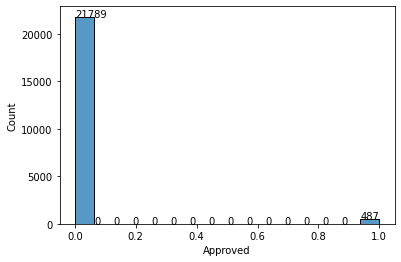

In [51]:
ax = sns.histplot(newTrain_cleaned.iloc[:,-1])
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height()))

In [52]:
newTrain_cleaned.iloc[:,-1].value_counts()

0    21789
1      487
Name: Approved, dtype: int64

In [53]:
newX=newTrain_cleaned.iloc[:,:-1]
newy=newTrain_cleaned.iloc[:,-1]
newX_train, newX_val, newy_train, newy_val = train_test_split(newX, newy, test_size=0.2, random_state=42)
newX_train.shape, newX_val.shape

((17820, 21), (4456, 21))

In [54]:
print('Model training in progress...')
kfold = KFold(n_splits=10, shuffle=True, random_state=22)
parameters = {'clf__n_estimators': [4, 6, 9], 'clf__max_features': ['log2', 
'sqrt','auto'],'clf__criterion': ['entropy', 'gini'], 'clf__max_depth': [2, 
 3, 5, 10], 'clf__min_samples_split': [2, 3, 5],
'clf__min_samples_leaf': [1,5,8] }

grid_RF=GridSearchCV(pca_clf,param_grid=parameters,
       scoring=CONFIG['scorings'],refit="f1_macro",cv=kfold)
grid_RF = grid_RF.fit(X_train, y_train)
clf = grid_RF.best_estimator_
clf.fit(X_train, y_train)
print(f'Training completed, use {(time()-start):.2} sec')
print(classification_report(newy_val, svc.predict(newX_val), zero_division=0))


Model training in progress...


NameError: name 'pca_clf' is not defined